In [2]:
import numpy as np
import pandas as pd

In [3]:
df=pd.read_csv('/content/data.xlsx - Sheet1.csv')

In [4]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [5]:
df.drop(df.columns[[0]], axis=1, inplace=True)

In [6]:
df.head(10)

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.30,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.40,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.00,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.60,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.00,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
5,1027655,300000.0,6/1/14 0:00,present,system engineer,Hyderabad,m,7/2/92 0:00,89.92,state board,...,407,-1,-1,-1,-1,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608
6,947847,300000.0,8/1/14 0:00,5/1/15 0:00,java software engineer,Banglore,m,2/1/93 0:00,86.08,state board,...,346,-1,-1,-1,-1,1.7081,-0.1054,-1.0379,-2.00920,-1.0872
7,912934,400000.0,7/1/14 0:00,7/1/15 0:00,mechanical engineer,Bangalore,m,5/27/92 0:00,92.00,cbse,...,-1,469,-1,-1,-1,-0.0154,1.2114,0.0100,0.14590,1.2470
8,552574,600000.0,7/1/13 0:00,present,electrical engineer,Noida,m,9/17/91 0:00,90.00,cbse,...,-1,-1,-1,-1,-1,-0.1590,0.5454,-0.6048,-0.74150,-0.2859
9,1203363,230000.0,7/1/14 0:00,present,project engineer,Kolkata,m,6/13/93 0:00,77.00,cbse,...,-1,-1,-1,-1,-1,-1.3080,0.5454,-0.9122,0.90660,0.0973


In [7]:
df.shape

(3998, 38)

In [8]:
#Data Exploration & Cleaning
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
3993    False
3994    False
3995    False
3996    False
3997    False
Length: 3998, dtype: bool

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     3998 non-null   int64  
 1   Salary                 3998 non-null   float64
 2   DOJ                    3998 non-null   object 
 3   DOL                    3998 non-null   object 
 4   Designation            3998 non-null   object 
 5   JobCity                3998 non-null   object 
 6   Gender                 3998 non-null   object 
 7   DOB                    3998 non-null   object 
 8   10percentage           3998 non-null   float64
 9   10board                3998 non-null   object 
 10  12graduation           3998 non-null   int64  
 11  12percentage           3998 non-null   float64
 12  12board                3998 non-null   object 
 13  CollegeID              3998 non-null   int64  
 14  CollegeTier            3998 non-null   int64  
 15  Degr

In [10]:
cat_values=[col for col in df.columns if df[col].dtype=='object']
print('Cattegorical Values:', cat_values)

num_values=[col for col in df.columns if df[col].dtype=='int']
print('Numerical Values:', num_values)

float_values=[col for col in df.columns if df[col].dtype=='float']
print('Numerical Values:', float_values)

Cattegorical Values: ['DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB', '10board', '12board', 'Degree', 'Specialization', 'CollegeState']
Numerical Values: ['ID', '12graduation', 'CollegeID', 'CollegeTier', 'CollegeCityID', 'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg']
Numerical Values: ['Salary', '10percentage', '12percentage', 'collegeGPA', 'Domain', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']


In [11]:
df[cat_values].nunique()

DOJ                 81
DOL                 67
Designation        419
JobCity            339
Gender               2
DOB               1872
10board            275
12board            340
Degree               4
Specialization      46
CollegeState        26
dtype: int64

In [12]:
df.isnull()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3994,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3995,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3996,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


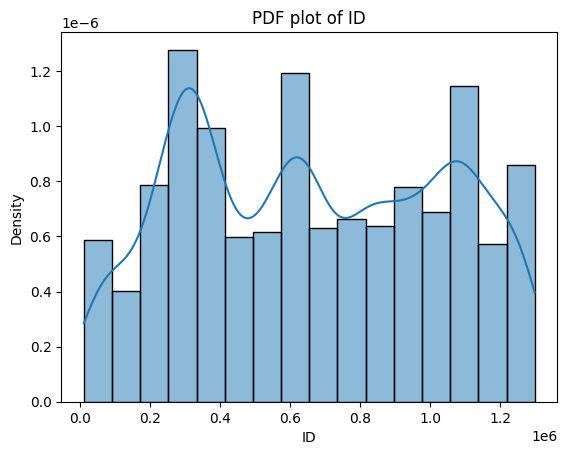

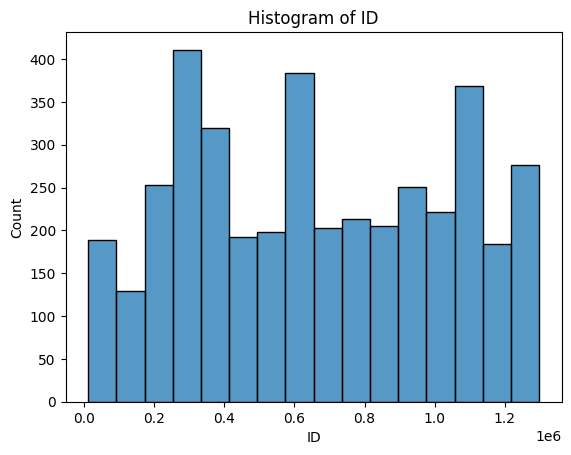

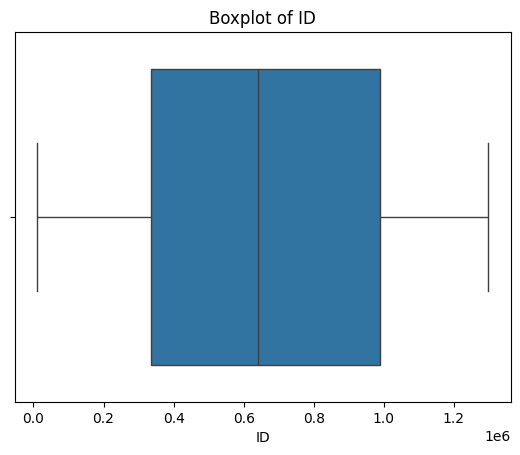

Outliers in ID: Empty DataFrame
Columns: [ID, Salary, DOJ, DOL, Designation, JobCity, Gender, DOB, 10percentage, 10board, 12graduation, 12percentage, 12board, CollegeID, CollegeTier, Degree, Specialization, collegeGPA, CollegeCityID, CollegeCityTier, CollegeState, GraduationYear, English, Logical, Quant, Domain, ComputerProgramming, ElectronicsAndSemicon, ComputerScience, MechanicalEngg, ElectricalEngg, TelecomEngg, CivilEngg, conscientiousness, agreeableness, extraversion, nueroticism, openess_to_experience]
Index: []

[0 rows x 38 columns]


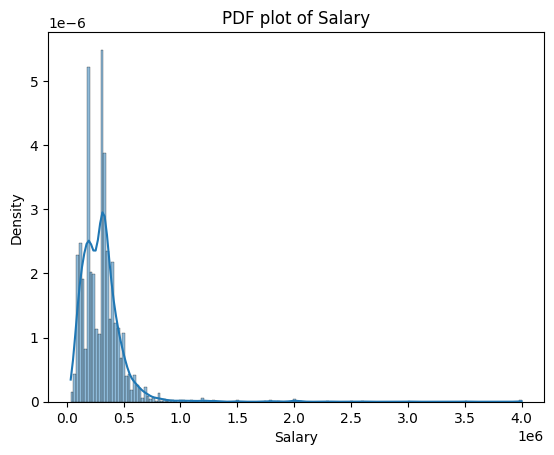

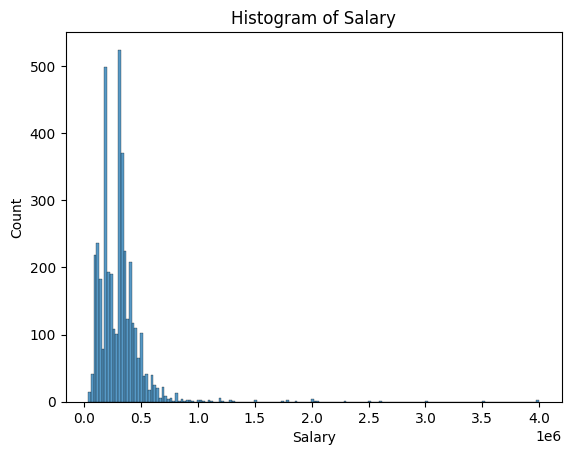

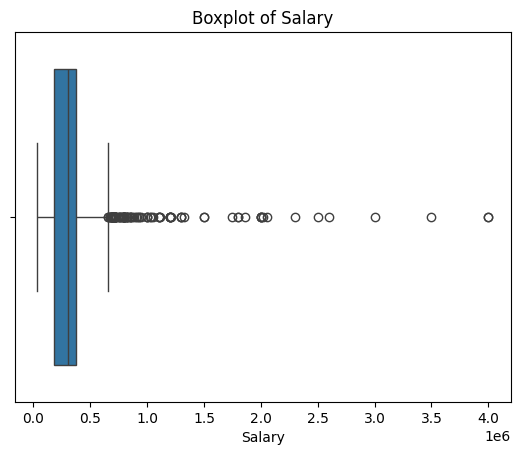

Outliers in Salary:            ID     Salary           DOJ          DOL  \
3      267447  1100000.0   7/1/11 0:00      present   
76     361583   800000.0   6/1/12 0:00      present   
92    1250429  1500000.0  11/1/14 0:00  7/1/14 0:00   
123    312164  1200000.0   7/1/10 0:00  7/1/11 0:00   
128    206734   675000.0  11/1/11 0:00      present   
...       ...        ...           ...          ...   
3823   918568   775000.0   8/1/14 0:00      present   
3904   267121   850000.0   9/1/11 0:00      present   
3912   231229   730000.0   7/1/13 0:00      present   
3961   230702   700000.0   7/1/11 0:00  9/1/14 0:00   
3992   344407   800000.0   4/1/14 0:00  4/1/15 0:00   

                     Designation      JobCity Gender            DOB  \
3       senior software engineer      Gurgaon      m   12/5/89 0:00   
76             software engineer    Bangalore      m   1/25/91 0:00   
92         application developer    Hyderabad      m    1/4/92 0:00   
123             engineer trainee  M

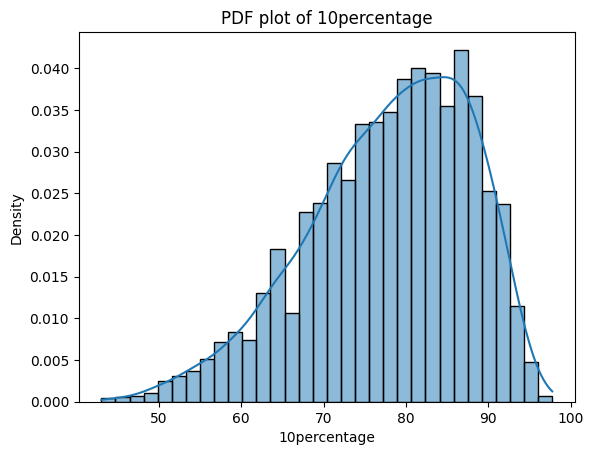

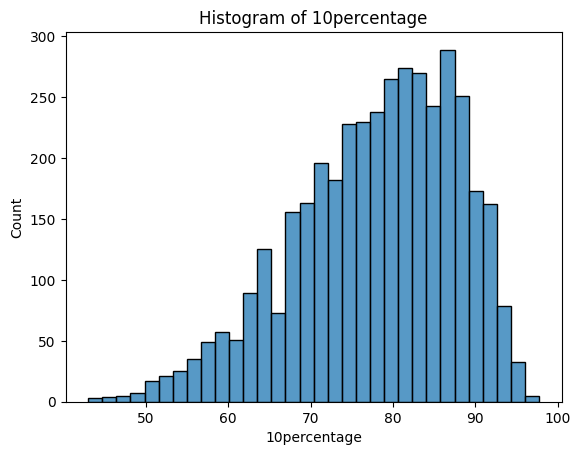

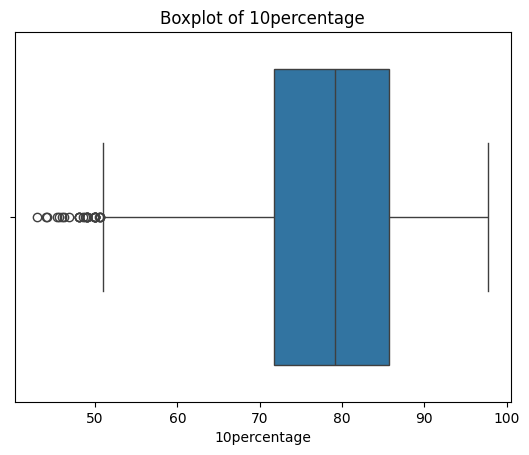

Outliers in 10percentage:            ID    Salary           DOJ           DOL  \
245    984958  285000.0   8/1/14 0:00   4/1/15 0:00   
466   1245184  215000.0   1/1/15 0:00   4/1/15 0:00   
490    302937  150000.0   7/1/11 0:00  11/1/12 0:00   
491     53838  100000.0   5/1/10 0:00   1/1/11 0:00   
502   1160766  240000.0   1/1/15 0:00   4/1/15 0:00   
600    918414  200000.0  11/1/08 0:00  11/1/12 0:00   
613    228081  440000.0   5/1/13 0:00       present   
898    212005  270000.0   3/1/13 0:00       present   
919   1231953  450000.0   7/1/14 0:00   6/1/15 0:00   
1064   277260  250000.0   9/1/11 0:00  12/1/14 0:00   
1102   311098  120000.0  12/1/12 0:00   1/1/15 0:00   
1169   179878  105000.0   1/1/11 0:00   6/1/11 0:00   
1193   309190  180000.0  12/1/12 0:00  12/1/13 0:00   
1235   325701  115000.0  11/1/12 0:00   1/1/13 0:00   
1334   240133  110000.0   1/1/12 0:00   8/1/12 0:00   
1838   637345  190000.0   1/1/14 0:00   4/1/15 0:00   
1845  1251526  150000.0  12/1/14 0:00  

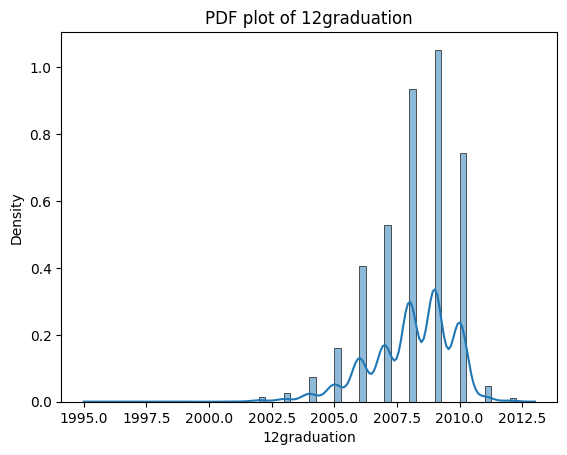

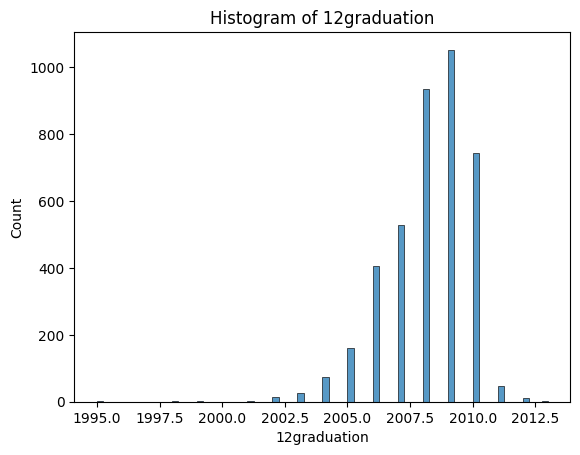

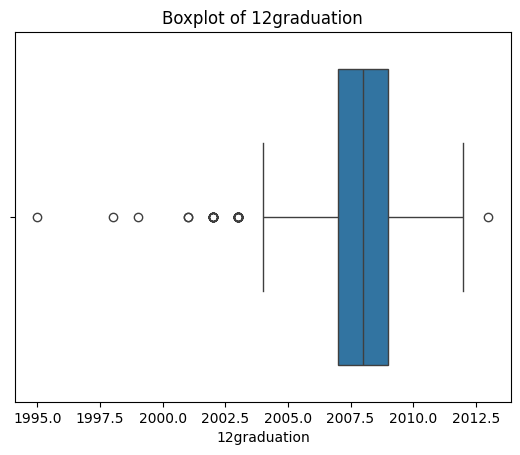

Outliers in 12graduation:            ID     Salary           DOJ           DOL  \
59     536053   120000.0   9/1/09 0:00   4/1/13 0:00   
193    231253   550000.0   8/1/11 0:00   4/1/15 0:00   
528    289374   250000.0   5/1/11 0:00   9/1/13 0:00   
584    203323   430000.0   4/1/10 0:00       present   
600    918414   200000.0  11/1/08 0:00  11/1/12 0:00   
670     50670   160000.0   2/1/10 0:00   2/1/13 0:00   
712    114364   400000.0  11/1/10 0:00   9/1/13 0:00   
772   1000456   320000.0   7/1/13 0:00   2/1/15 0:00   
828     54579   195000.0   4/1/10 0:00  12/1/11 0:00   
890    134985   310000.0   9/1/10 0:00   2/1/15 0:00   
1083   243897   400000.0   1/1/12 0:00       present   
1169   179878   105000.0   1/1/11 0:00   6/1/11 0:00   
1178   266342   320000.0   5/1/11 0:00   9/1/13 0:00   
1404   626059   700000.0   6/1/13 0:00       present   
1420    59151   200000.0   1/1/10 0:00   1/1/13 0:00   
1502   678819   200000.0   5/1/13 0:00   7/1/13 0:00   
1528   257095   110000

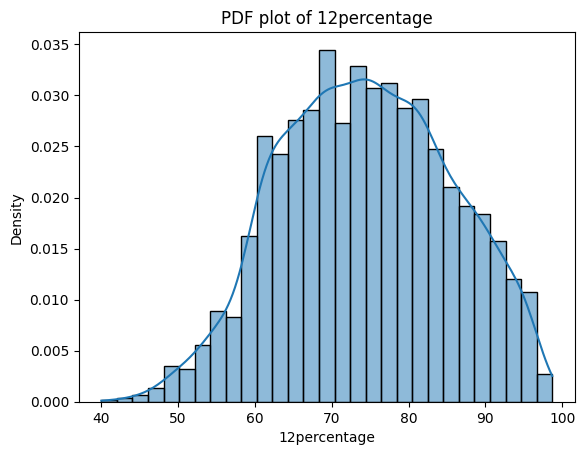

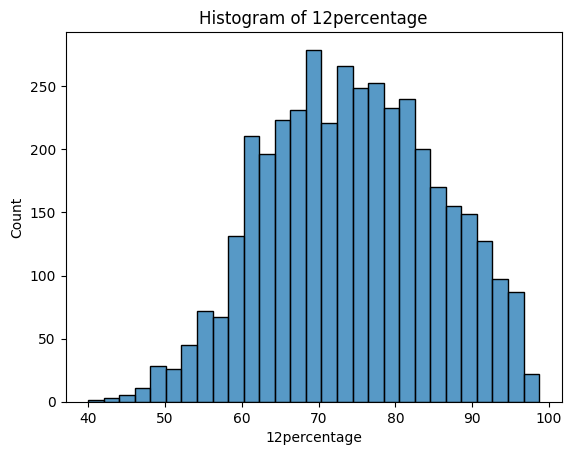

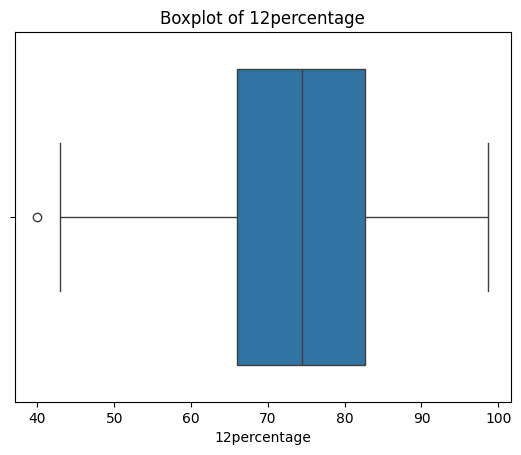

Outliers in 12percentage:           ID    Salary          DOJ          DOL           Designation  \
3337  258677  300000.0  9/1/10 0:00  6/1/14 0:00  system administrator   

        JobCity Gender           DOB  10percentage 10board  ...  \
3337  Hyderabad      m  6/21/84 0:00          74.0       0  ...   

      ComputerScience  MechanicalEngg ElectricalEngg  TelecomEngg  CivilEngg  \
3337               -1              -1             -1           -1         -1   

     conscientiousness agreeableness  extraversion  nueroticism  \
3337            -0.881        0.0328       -1.5051      -0.2902   

      openess_to_experience  
3337                -0.9194  

[1 rows x 38 columns]


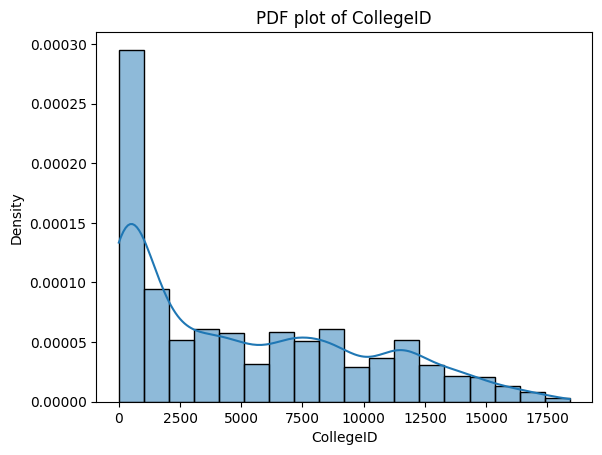

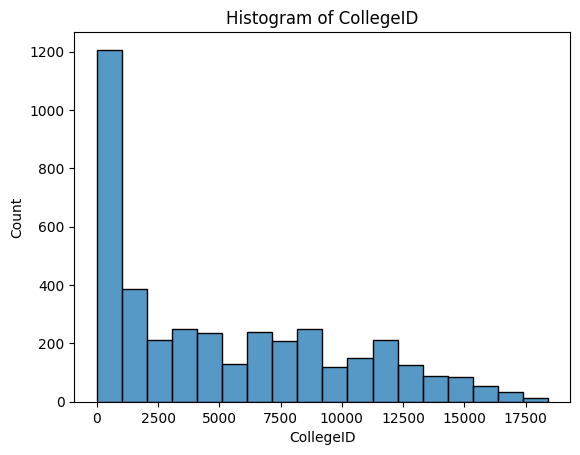

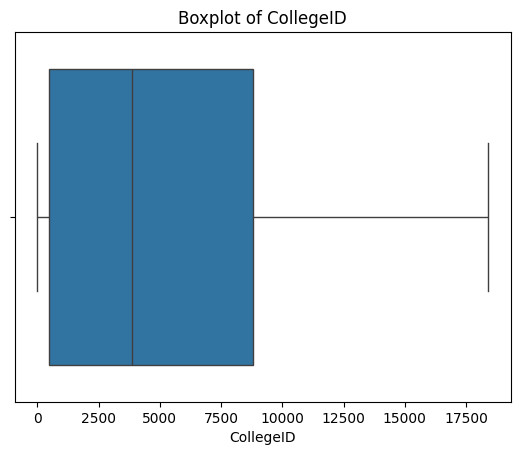

Outliers in CollegeID: Empty DataFrame
Columns: [ID, Salary, DOJ, DOL, Designation, JobCity, Gender, DOB, 10percentage, 10board, 12graduation, 12percentage, 12board, CollegeID, CollegeTier, Degree, Specialization, collegeGPA, CollegeCityID, CollegeCityTier, CollegeState, GraduationYear, English, Logical, Quant, Domain, ComputerProgramming, ElectronicsAndSemicon, ComputerScience, MechanicalEngg, ElectricalEngg, TelecomEngg, CivilEngg, conscientiousness, agreeableness, extraversion, nueroticism, openess_to_experience]
Index: []

[0 rows x 38 columns]


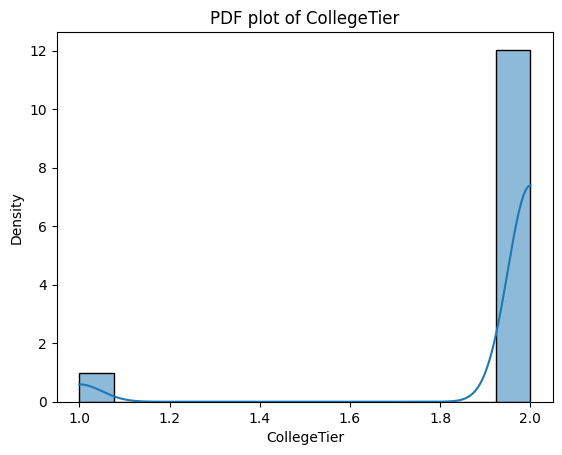

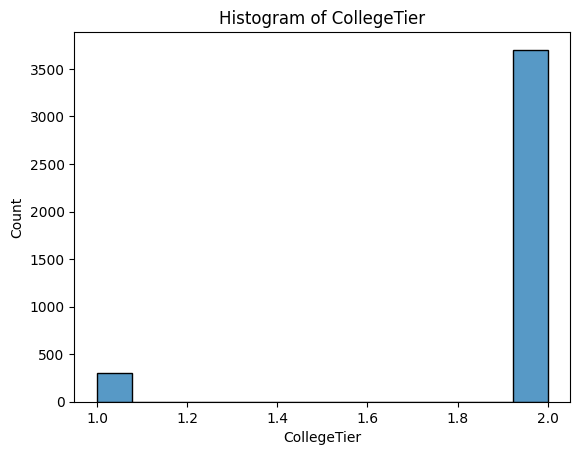

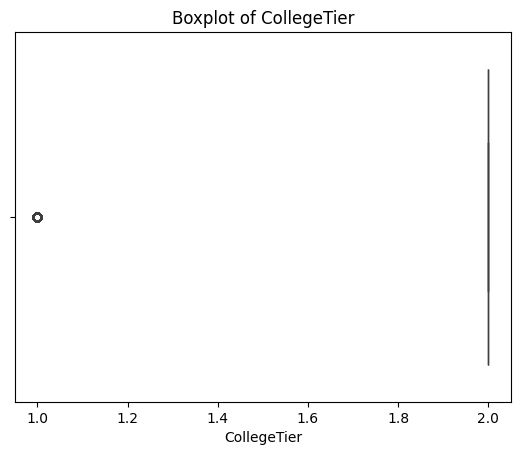

Outliers in CollegeTier:            ID     Salary           DOJ           DOL  \
3      267447  1100000.0   7/1/11 0:00       present   
7      912934   400000.0   7/1/14 0:00   7/1/15 0:00   
8      552574   600000.0   7/1/13 0:00       present   
11     190393   450000.0   8/1/11 0:00  10/1/14 0:00   
32     580616   360000.0  10/1/13 0:00       present   
...       ...        ...           ...           ...   
3912   231229   730000.0   7/1/13 0:00       present   
3913   913446   370000.0   6/1/14 0:00   4/1/15 0:00   
3914   816649   220000.0  10/1/14 0:00   3/1/15 0:00   
3972  1044603   180000.0   3/1/15 0:00   5/1/15 0:00   
3979   212055   550000.0   7/1/13 0:00   4/1/14 0:00   

                               Designation     JobCity Gender            DOB  \
3                 senior software engineer     Gurgaon      m   12/5/89 0:00   
7                      mechanical engineer   Bangalore      m   5/27/92 0:00   
8                      electrical engineer       Noida      m 

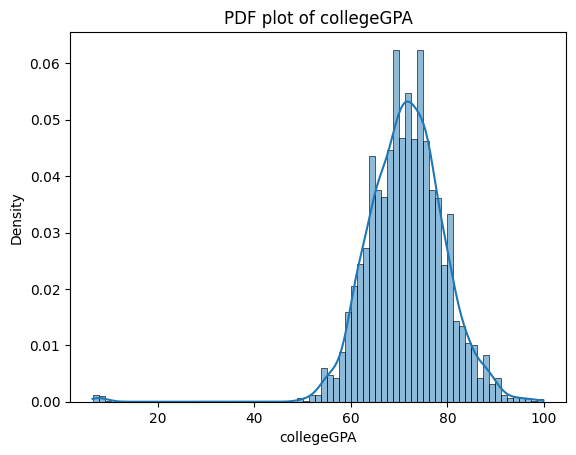

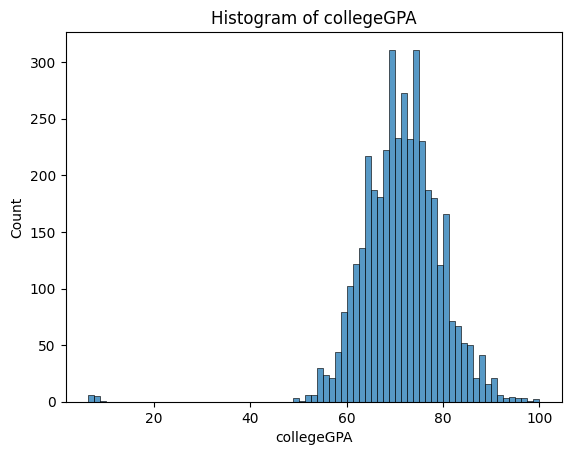

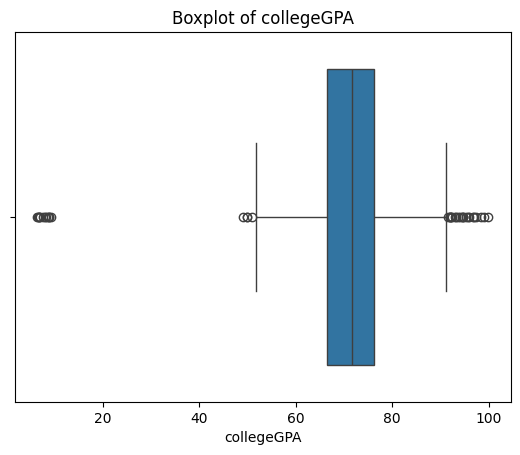

Outliers in collegeGPA:            ID     Salary           DOJ           DOL  \
7      912934   400000.0   7/1/14 0:00   7/1/15 0:00   
44     247617   380000.0   5/1/12 0:00   4/1/15 0:00   
138    964319   195000.0  10/1/14 0:00   1/1/15 0:00   
187    336792   410000.0   2/1/13 0:00       present   
477    345838   225000.0   6/1/13 0:00   4/1/15 0:00   
614    237941   655000.0   7/1/11 0:00       present   
690    609356   440000.0  10/1/13 0:00   4/1/15 0:00   
788    249853   180000.0   5/1/12 0:00   6/1/13 0:00   
874    337594   400000.0   2/1/13 0:00   4/1/15 0:00   
907    324190   100000.0   2/1/13 0:00   4/1/14 0:00   
1029   337629   300000.0   4/1/13 0:00   4/1/15 0:00   
1134    56871   350000.0   4/1/10 0:00   8/1/12 0:00   
1264   220634   500000.0   8/1/11 0:00   6/1/12 0:00   
1345   619658   460000.0   7/1/13 0:00  11/1/14 0:00   
1419  1262900   180000.0  10/1/14 0:00   4/1/15 0:00   
1439   299447   360000.0   8/1/11 0:00       present   
1510   331122   560000.0

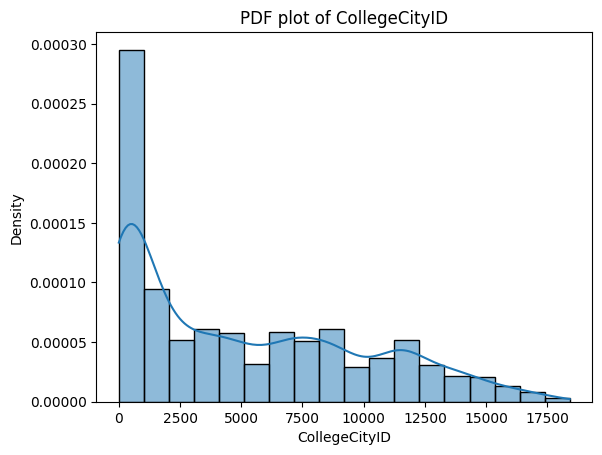

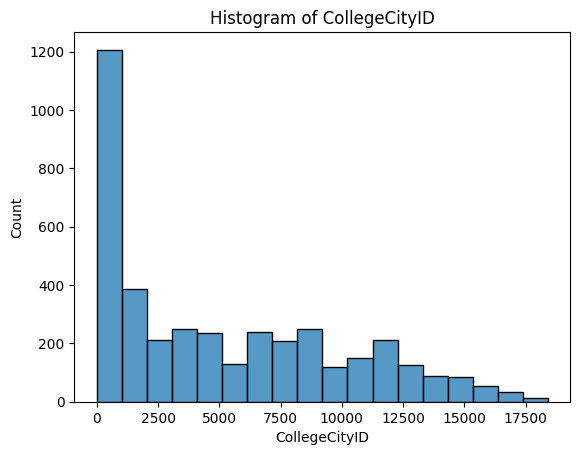

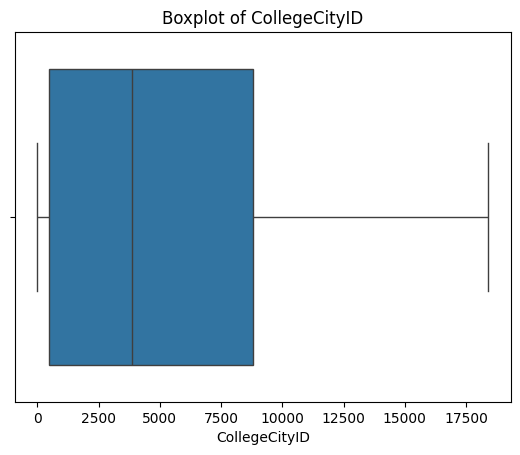

Outliers in CollegeCityID: Empty DataFrame
Columns: [ID, Salary, DOJ, DOL, Designation, JobCity, Gender, DOB, 10percentage, 10board, 12graduation, 12percentage, 12board, CollegeID, CollegeTier, Degree, Specialization, collegeGPA, CollegeCityID, CollegeCityTier, CollegeState, GraduationYear, English, Logical, Quant, Domain, ComputerProgramming, ElectronicsAndSemicon, ComputerScience, MechanicalEngg, ElectricalEngg, TelecomEngg, CivilEngg, conscientiousness, agreeableness, extraversion, nueroticism, openess_to_experience]
Index: []

[0 rows x 38 columns]


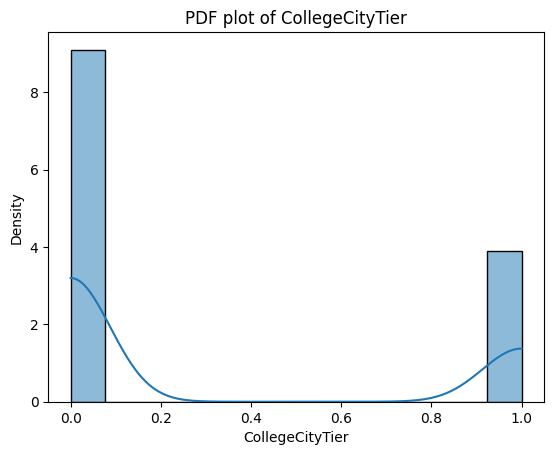

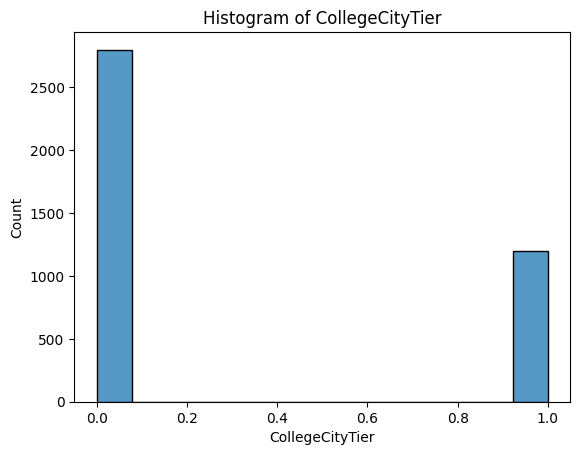

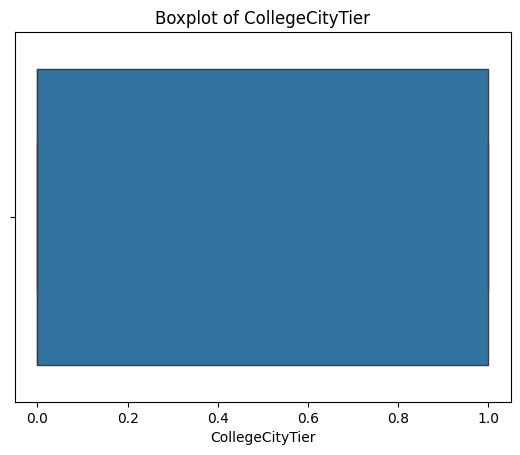

Outliers in CollegeCityTier: Empty DataFrame
Columns: [ID, Salary, DOJ, DOL, Designation, JobCity, Gender, DOB, 10percentage, 10board, 12graduation, 12percentage, 12board, CollegeID, CollegeTier, Degree, Specialization, collegeGPA, CollegeCityID, CollegeCityTier, CollegeState, GraduationYear, English, Logical, Quant, Domain, ComputerProgramming, ElectronicsAndSemicon, ComputerScience, MechanicalEngg, ElectricalEngg, TelecomEngg, CivilEngg, conscientiousness, agreeableness, extraversion, nueroticism, openess_to_experience]
Index: []

[0 rows x 38 columns]


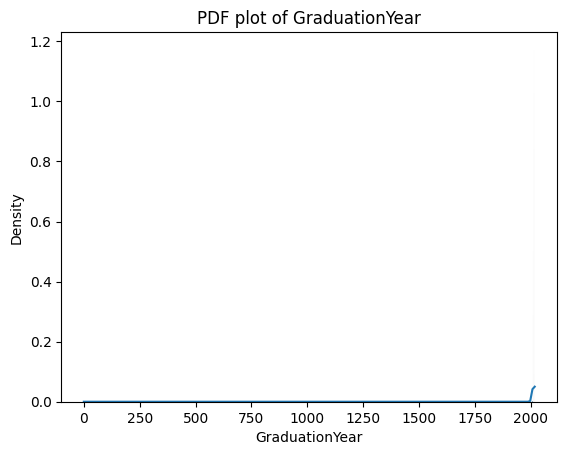

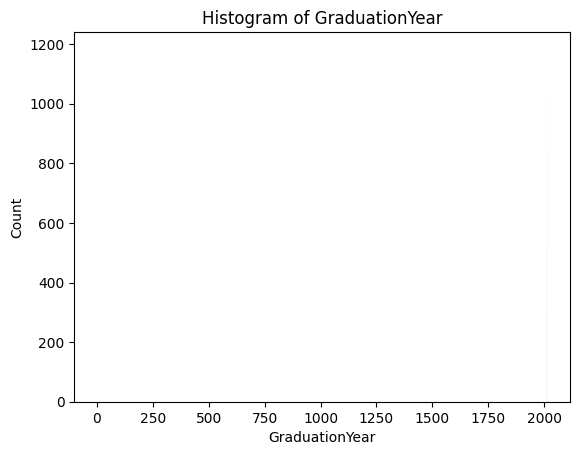

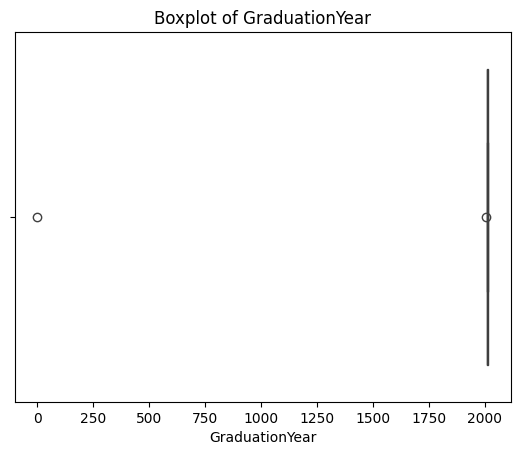

Outliers in GraduationYear:           ID    Salary          DOJ          DOL        Designation  \
2664  794381  325000.0  7/1/14 0:00  7/1/15 0:00   systems engineer   
3193  480729  120000.0  6/1/07 0:00  6/1/09 0:00  software engineer   

         JobCity Gender            DOB  10percentage         10board  ...  \
2664  Chandigarh      m  12/17/91 0:00          89.0            cbse  ...   
3193   Hyderabad      m   6/18/86 0:00          83.5  ap state board  ...   

      ComputerScience  MechanicalEngg ElectricalEngg  TelecomEngg  CivilEngg  \
2664               -1             446             -1           -1         -1   
3193               -1              -1             -1           -1         -1   

     conscientiousness agreeableness  extraversion  nueroticism  \
2664            1.1336        0.3789       -0.2974      -0.3612   
3193           -1.4992       -0.7863       -2.0131       0.4148   

      openess_to_experience  
2664                -1.2440  
3193                -0.

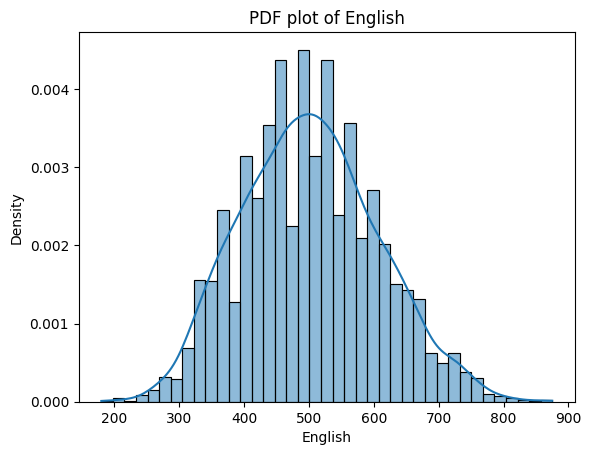

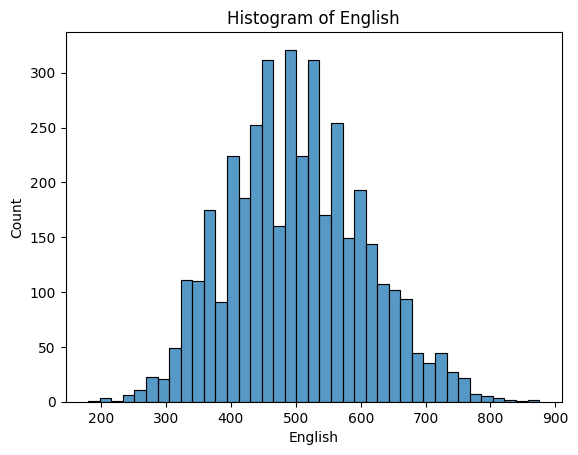

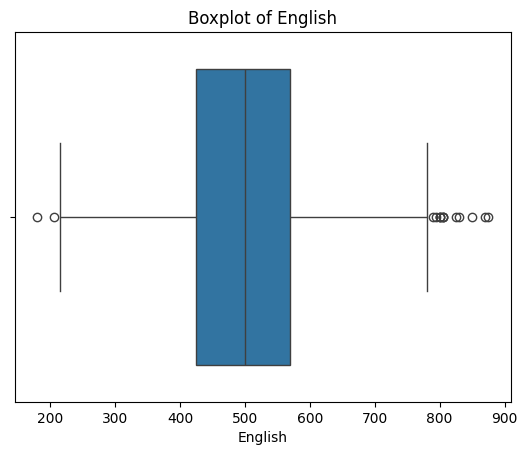

Outliers in English:            ID    Salary           DOJ          DOL  \
275   1023622  305000.0   8/1/14 0:00      present   
444    283164  715000.0   1/1/12 0:00      present   
668    609043  440000.0  10/1/13 0:00      present   
839    693533  315000.0   8/1/13 0:00  2/1/15 0:00   
847    608938  600000.0   7/1/13 0:00  6/1/14 0:00   
935    513149  150000.0   9/1/12 0:00  8/1/13 0:00   
1183  1083037  310000.0   9/1/14 0:00      present   
1217   669692  600000.0  10/1/14 0:00  2/1/15 0:00   
1450  1284437  200000.0   1/1/15 0:00  7/1/15 0:00   
1519   984550  320000.0  10/1/14 0:00      present   
2077   922684  305000.0   9/1/14 0:00  4/1/15 0:00   
2122   605290  180000.0   4/1/12 0:00  2/1/13 0:00   
2385   683102  325000.0   2/1/14 0:00      present   
2596  1088319  610000.0   7/1/14 0:00  4/1/15 0:00   
3044   837923  360000.0  12/1/13 0:00  3/1/15 0:00   

                          Designation     JobCity Gender            DOB  \
275                 software engineer  

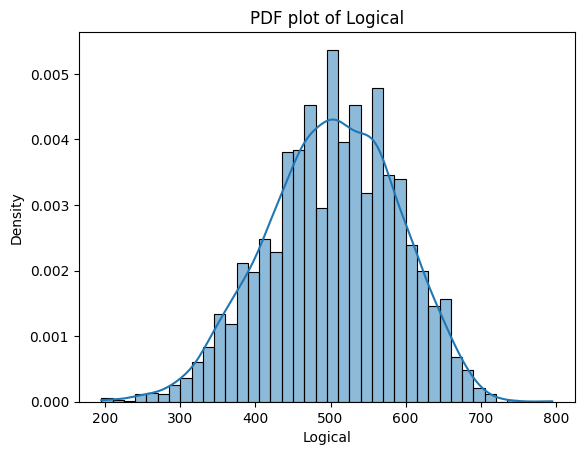

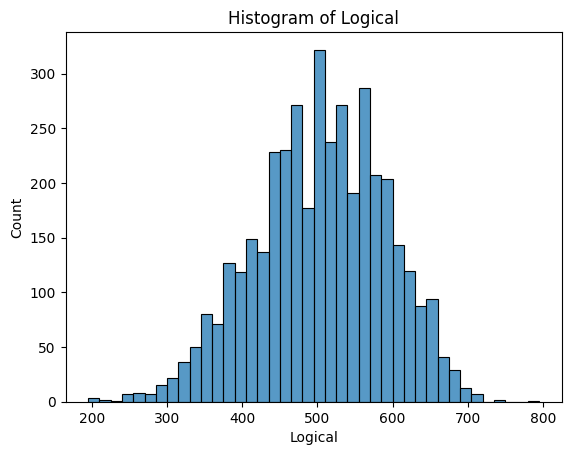

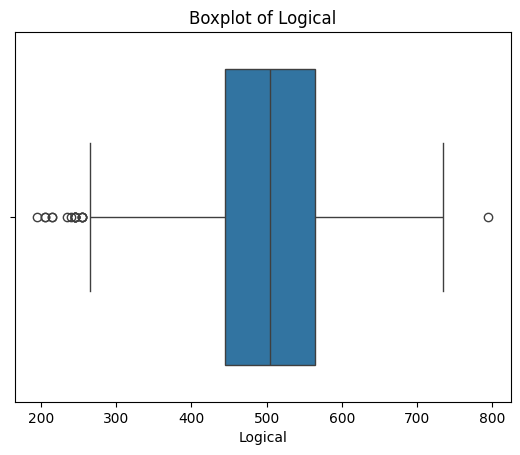

Outliers in Logical:            ID    Salary           DOJ           DOL               Designation  \
101     43693  205000.0  12/1/11 0:00       present       electrical engineer   
133    434552  300000.0   6/1/14 0:00   4/1/15 0:00     marketing coordinator   
207    457244  360000.0   4/1/13 0:00       present         software engineer   
345     60315  110000.0   7/1/11 0:00   5/1/12 0:00      maintenance engineer   
628     47805  505000.0  12/1/10 0:00   6/1/14 0:00  senior software engineer   
1014   649530  350000.0   2/1/14 0:00       present           system engineer   
1160    65483  325000.0   4/1/12 0:00       present    software test engineer   
1439   299447  360000.0   8/1/11 0:00       present       assistant professor   
2141   340045  100000.0   4/1/13 0:00   9/1/13 0:00        software developer   
2265   126975  300000.0   9/1/10 0:00  10/1/13 0:00           senior engineer   
2796  1087183  100000.0   2/1/15 0:00   3/1/15 0:00        software developer   
2830   

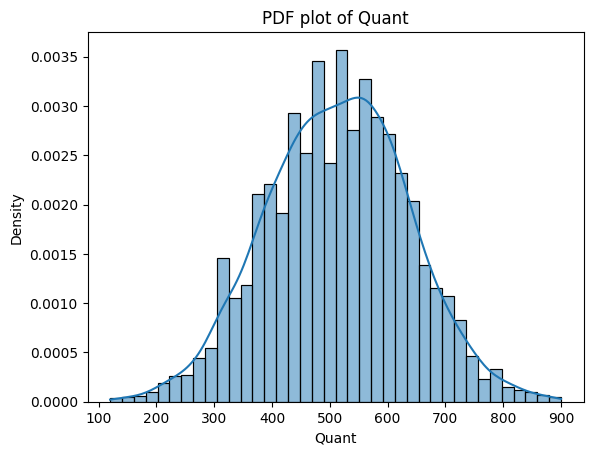

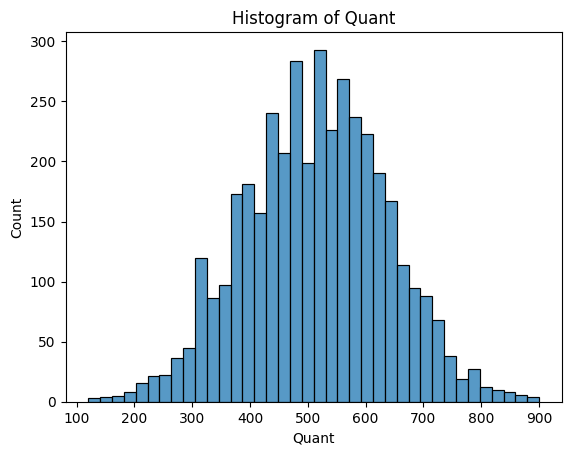

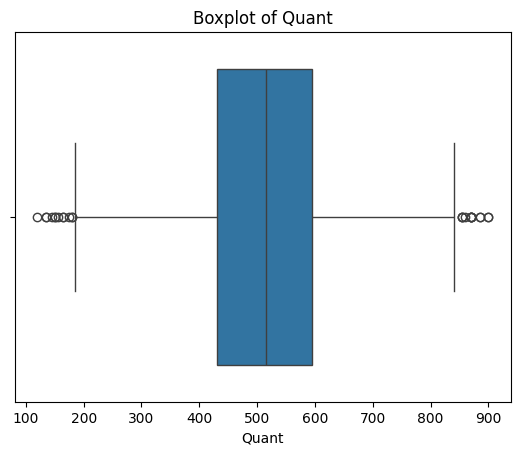

Outliers in Quant:            ID    Salary           DOJ           DOL  \
195    863466  350000.0  11/1/13 0:00   7/1/14 0:00   
522    640774   55000.0   2/1/14 0:00   5/1/14 0:00   
564    558050  185000.0   8/1/12 0:00   8/1/15 0:00   
698   1122860  300000.0   8/1/14 0:00       present   
783   1262957  190000.0  11/1/13 0:00   1/1/15 0:00   
899    602267  320000.0   9/1/14 0:00       present   
1148  1145718  100000.0  11/1/14 0:00   1/1/15 0:00   
1310   596083  450000.0   8/1/14 0:00       present   
1661   591405  605000.0   9/1/13 0:00       present   
1815   806357  205000.0   7/1/14 0:00   6/1/15 0:00   
2007   637441  350000.0  10/1/13 0:00   4/1/15 0:00   
2134   602029  150000.0  10/1/14 0:00   9/1/15 0:00   
2155   900799  320000.0   5/1/14 0:00       present   
2411   655464  390000.0   7/1/13 0:00       present   
2437   489860  120000.0   3/1/14 0:00   3/1/15 0:00   
2490   595163   80000.0   8/1/13 0:00   2/1/14 0:00   
2616   730091   80000.0   5/1/14 0:00   4/1/15

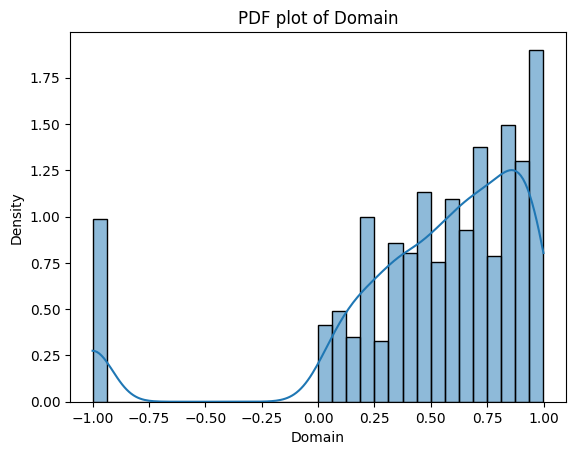

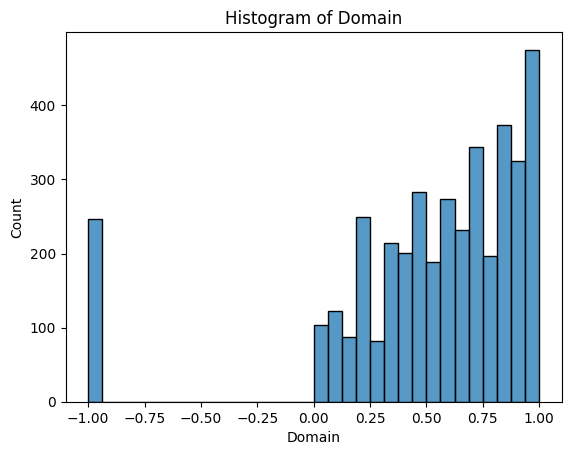

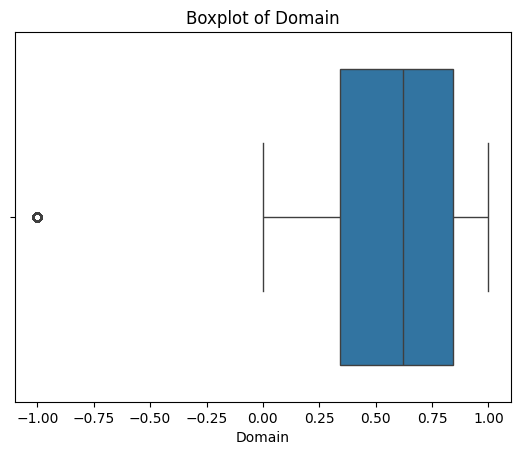

Outliers in Domain:            ID    Salary           DOJ          DOL  \
5     1027655  300000.0   6/1/14 0:00      present   
14    1279958  300000.0   7/1/13 0:00      present   
16    1087625  325000.0   9/1/14 0:00      present   
22     995191  190000.0  10/1/13 0:00  4/1/15 0:00   
35     942679  350000.0   3/1/14 0:00      present   
...       ...       ...           ...          ...   
3942  1067015  280000.0   7/1/13 0:00      present   
3958  1039020  310000.0   6/1/14 0:00      present   
3960  1037712  240000.0   8/1/13 0:00  1/1/14 0:00   
3969  1233826  330000.0   6/1/15 0:00      present   
3978  1274658  320000.0   8/1/13 0:00  1/1/14 0:00   

                       Designation    JobCity Gender           DOB  \
5                  system engineer  Hyderabad      m   7/2/92 0:00   
14          java software engineer  Bangalore      m   7/2/92 0:00   
16    product development engineer      Noida      m  6/10/92 0:00   
22                       developer  Hyderabad      

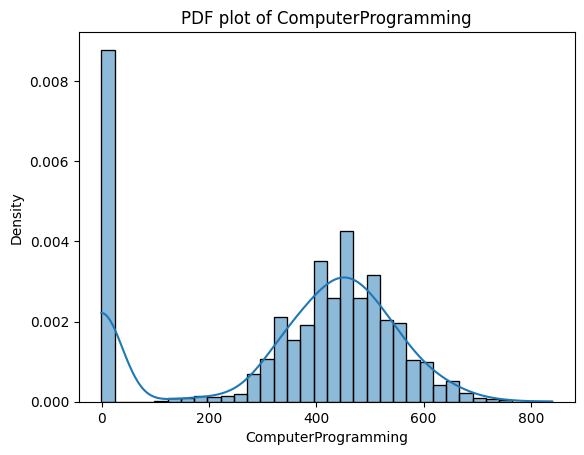

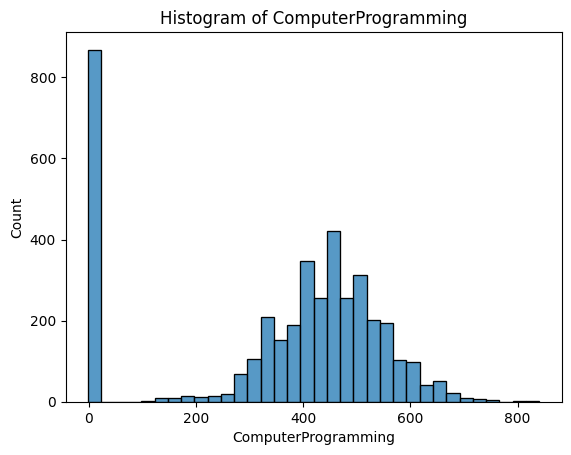

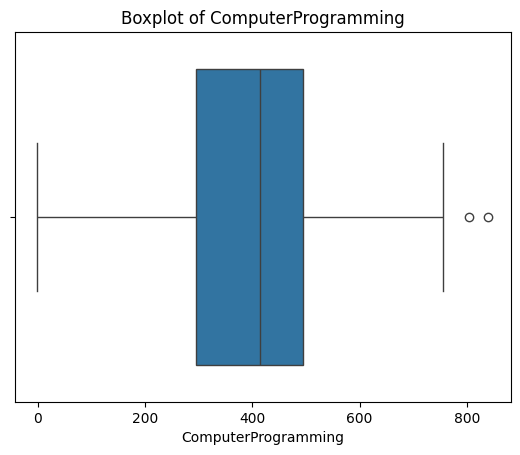

Outliers in ComputerProgramming:           ID    Salary          DOJ          DOL             Designation  \
64     31330  600000.0  7/1/10 0:00  7/1/12 0:00  java software engineer   
1711  712570  625000.0  2/1/14 0:00      present            data analyst   

      JobCity Gender           DOB  10percentage      10board  ...  \
64    Gurgaon      m  5/29/86 0:00          78.0         cbse  ...   
1711       -1      m  6/24/90 0:00          88.0  state board  ...   

      ComputerScience  MechanicalEngg ElectricalEngg  TelecomEngg  CivilEngg  \
64                 -1              -1             -1           -1         -1   
1711               -1             233             -1           -1         -1   

     conscientiousness agreeableness  extraversion  nueroticism  \
64              0.6646        0.3448        0.8171       0.6498   
1711           -0.7335       -0.7866       -0.4511      -1.5021   

      openess_to_experience  
64                   0.0284  
1711                -1.8

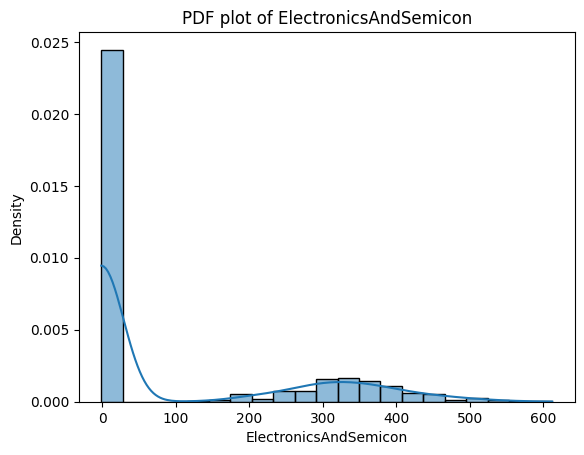

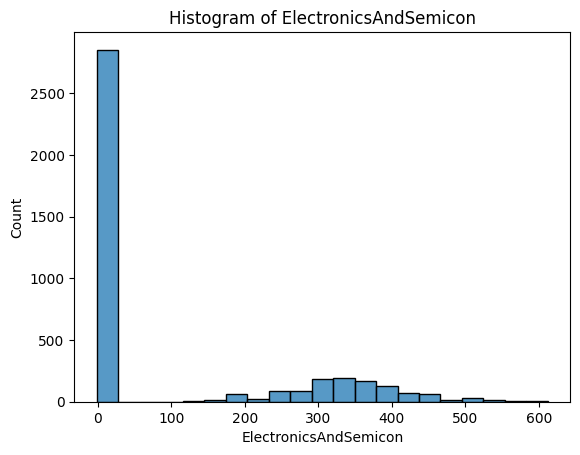

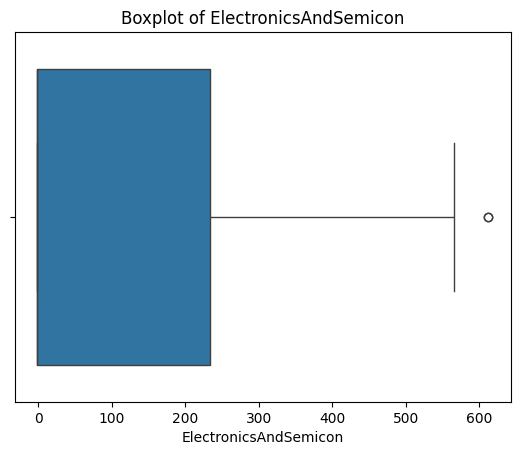

Outliers in ElectronicsAndSemicon:            ID    Salary           DOJ          DOL              Designation  \
1557  1157412  350000.0   7/1/14 0:00  4/1/15 0:00         systems engineer   
3889  1062520  325000.0  10/1/14 0:00      present  assistant store manager   

        JobCity Gender           DOB  10percentage      10board  ...  \
1557  Hyderabad      f  8/11/92 0:00          84.4         cbse  ...   
3889    Chennai      m  8/28/93 0:00          93.4  state board  ...   

      ComputerScience  MechanicalEngg ElectricalEngg  TelecomEngg  CivilEngg  \
1557               -1              -1            580           -1         -1   
3889               -1              -1             -1           -1         -1   

     conscientiousness agreeableness  extraversion  nueroticism  \
1557            1.8517        1.0449         0.010      -2.3895   
3889            0.1282        0.3789        -1.527      -0.8682   

      openess_to_experience  
1557                 0.8637  
3889   

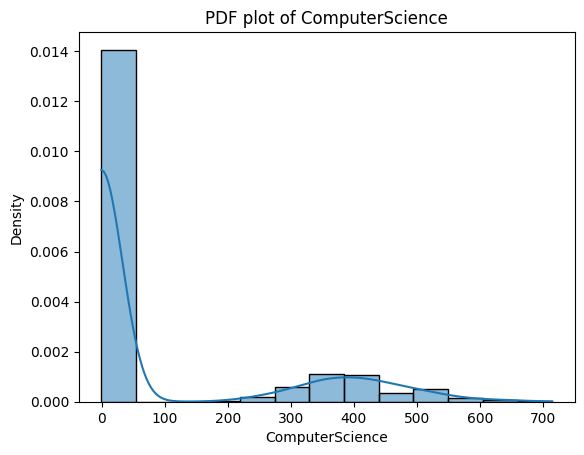

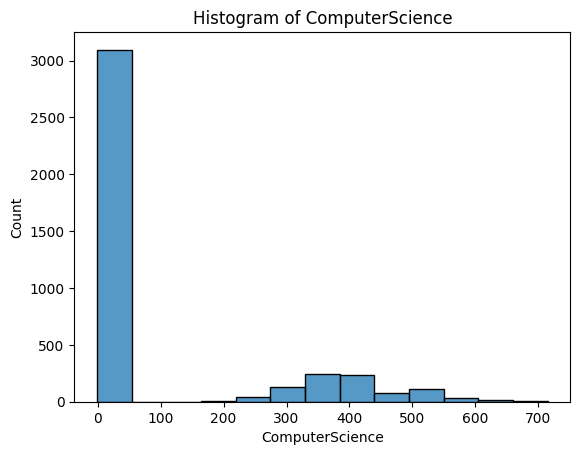

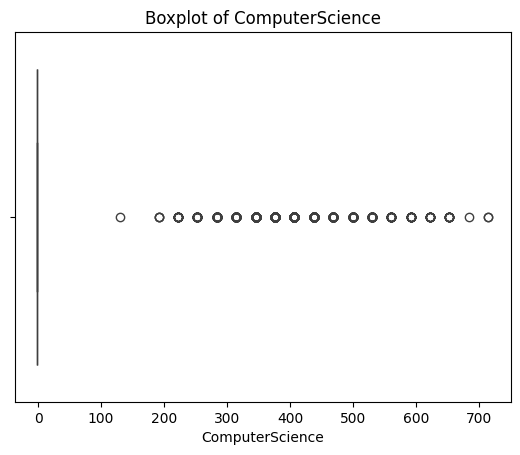

Outliers in ComputerScience:            ID    Salary          DOJ          DOL  \
5     1027655  300000.0  6/1/14 0:00      present   
6      947847  300000.0  8/1/14 0:00  5/1/15 0:00   
14    1279958  300000.0  7/1/13 0:00      present   
17     874596  250000.0  8/1/13 0:00  9/1/14 0:00   
24     963123  335000.0  6/1/14 0:00  6/1/15 0:00   
...       ...       ...          ...          ...   
3972  1044603  180000.0  3/1/15 0:00  5/1/15 0:00   
3976  1006997  300000.0  1/1/15 0:00      present   
3981  1077872  220000.0  9/1/14 0:00      present   
3989  1204604  300000.0  9/1/14 0:00      present   
3996   947111  200000.0  7/1/14 0:00  1/1/15 0:00   

                       Designation           JobCity Gender            DOB  \
5                  system engineer         Hyderabad      m    7/2/92 0:00   
6           java software engineer          Banglore      m    2/1/93 0:00   
14          java software engineer         Bangalore      m    7/2/92 0:00   
17    associate softwa

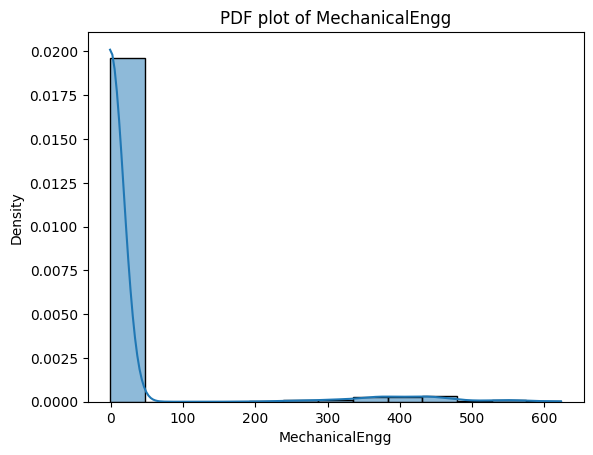

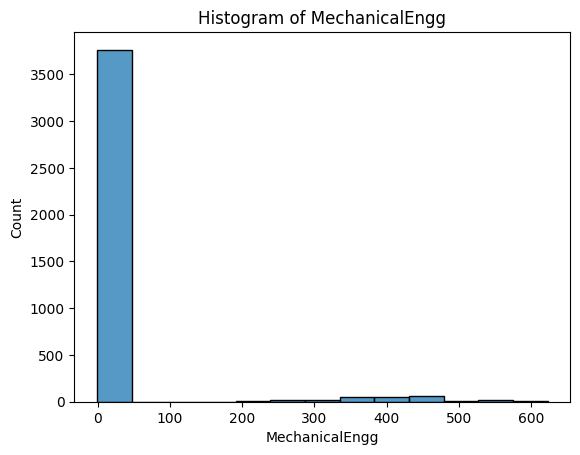

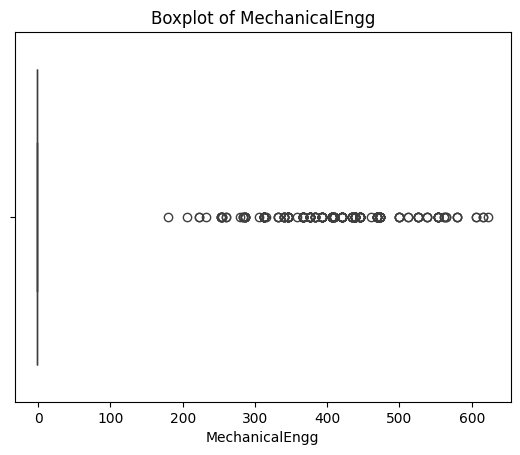

Outliers in MechanicalEngg:            ID    Salary          DOJ           DOL               Designation  \
7      912934  400000.0  7/1/14 0:00   7/1/15 0:00       mechanical engineer   
26      65096  345000.0  1/1/11 0:00  10/1/13 0:00  senior software engineer   
40     245887  120000.0  6/1/11 0:00   3/1/12 0:00              site manager   
45    1230582  110000.0  9/1/14 0:00   1/1/15 0:00       production engineer   
59     536053  120000.0  9/1/09 0:00   4/1/13 0:00         software engineer   
...       ...       ...          ...           ...                       ...   
3909   628271  210000.0  8/1/13 0:00       present       production engineer   
3916   530146  360000.0  6/1/13 0:00  12/1/14 0:00        management trainee   
3929   336937  100000.0  6/1/12 0:00   4/1/14 0:00              cad designer   
3951   885459  145000.0  5/1/14 0:00       present       mechanical engineer   
3980   197796  150000.0  7/1/11 0:00   7/1/12 0:00                       get   

          J

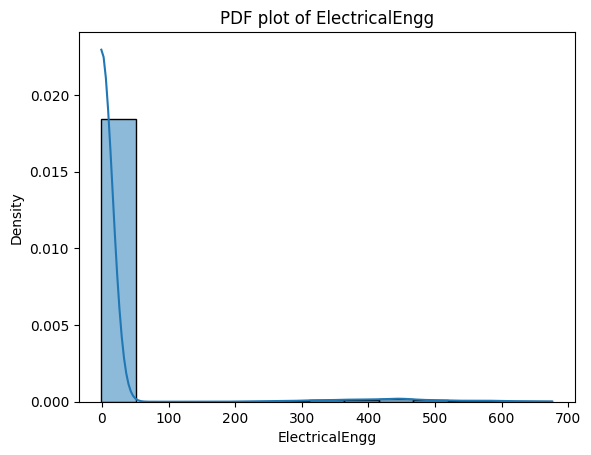

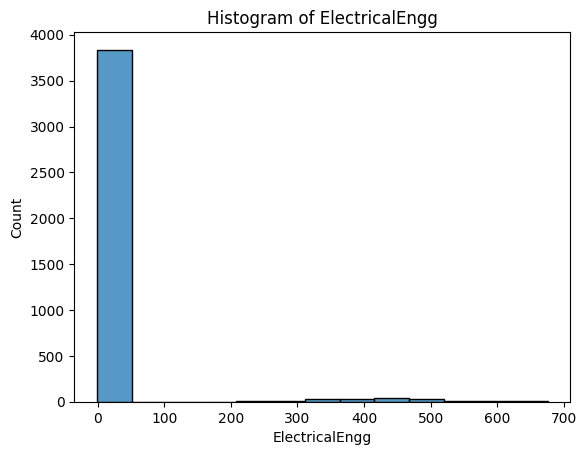

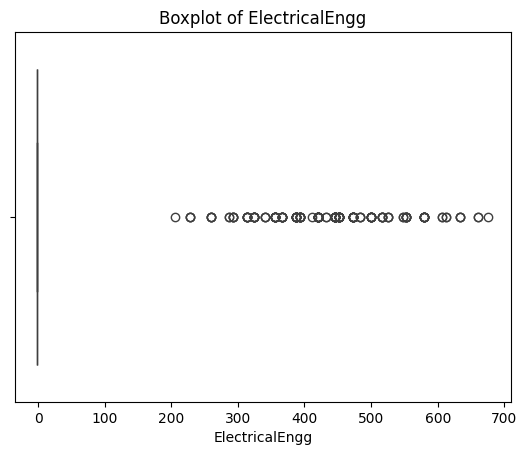

Outliers in ElectricalEngg:            ID    Salary           DOJ          DOL                Designation  \
53    1082717  350000.0   9/1/14 0:00      present  assistant system engineer   
70     801755  320000.0   3/1/14 0:00      present            system engineer   
124    614524  315000.0  11/1/14 0:00      present         programmer analyst   
125    796063  300000.0  11/1/14 0:00  3/1/15 0:00         programmer analyst   
180    639785  180000.0   9/1/13 0:00  4/1/14 0:00            design engineer   
...       ...       ...           ...          ...                        ...   
3832   625434  565000.0  10/1/13 0:00  4/1/15 0:00                   engineer   
3835  1081640  100000.0   4/1/14 0:00  2/1/15 0:00           project engineer   
3837   898548  350000.0  12/1/14 0:00      present      application developer   
3839   644828  360000.0   9/1/13 0:00      present                        ase   
3844  1219891  200000.0   1/1/15 0:00  6/1/15 0:00        electrical engineer   


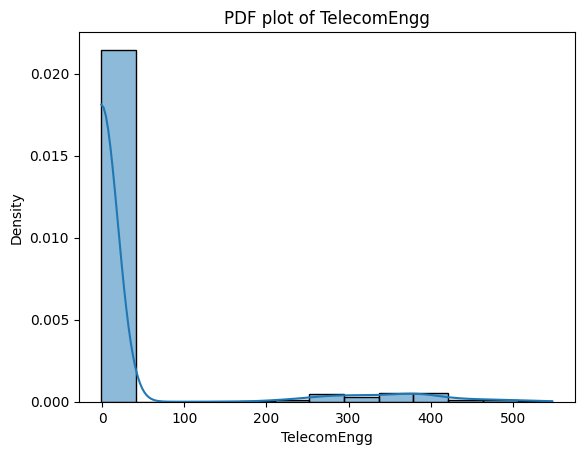

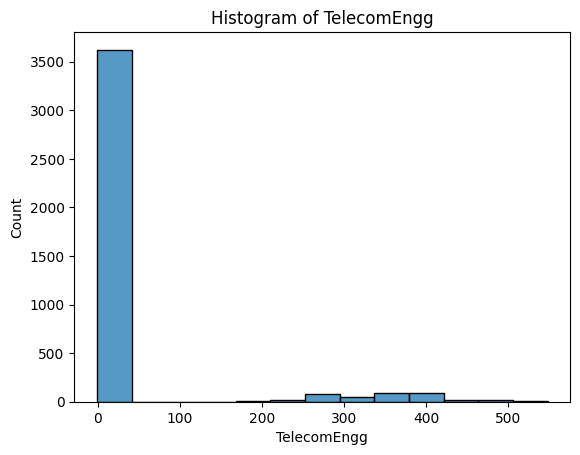

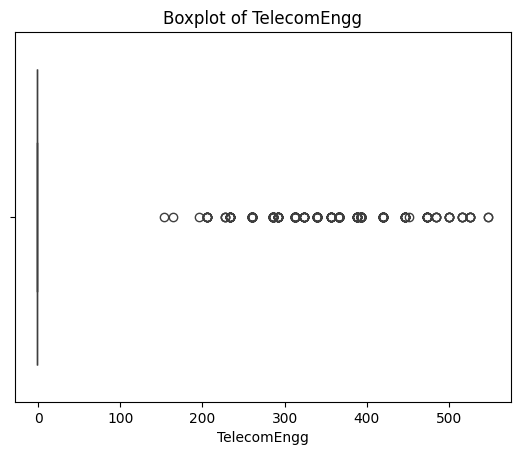

Outliers in TelecomEngg:            ID    Salary           DOJ           DOL  \
12     606655  270000.0  12/1/13 0:00       present   
28     918981  145000.0   2/1/15 0:00   4/1/15 0:00   
57     294700  525000.0   3/1/12 0:00       present   
62    1218578  145000.0   6/1/14 0:00       present   
81     661546  280000.0  10/1/14 0:00   4/1/15 0:00   
...       ...       ...           ...           ...   
3937   385546  205000.0  10/1/12 0:00   2/1/14 0:00   
3938   340205  300000.0   5/1/14 0:00       present   
3954   531726  310000.0   4/1/14 0:00   4/1/15 0:00   
3990   204287  480000.0   2/1/12 0:00       present   
3991   230873  630000.0   7/1/11 0:00  10/1/14 0:00   

                        Designation    JobCity Gender            DOB  \
12       quality assurance engineer       Pune      m  11/21/90 0:00   
28       telecommunication engineer      Noida      m   1/20/94 0:00   
57                    test engineer  Hyderabad      f   8/15/89 0:00   
62                        

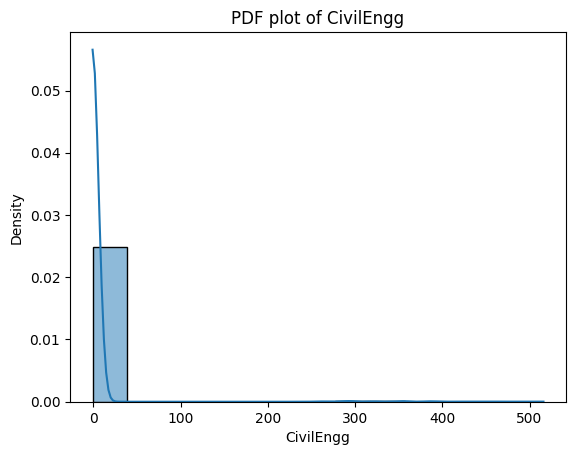

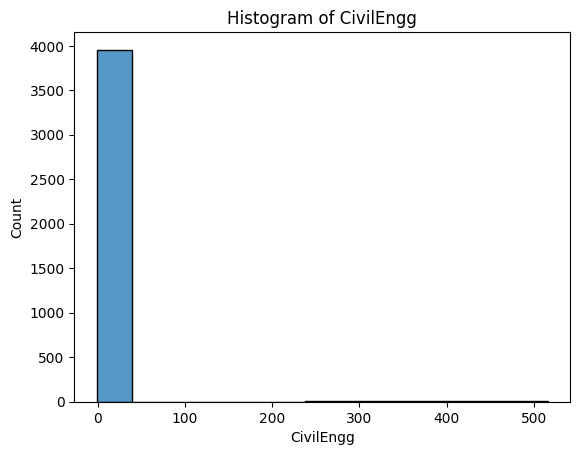

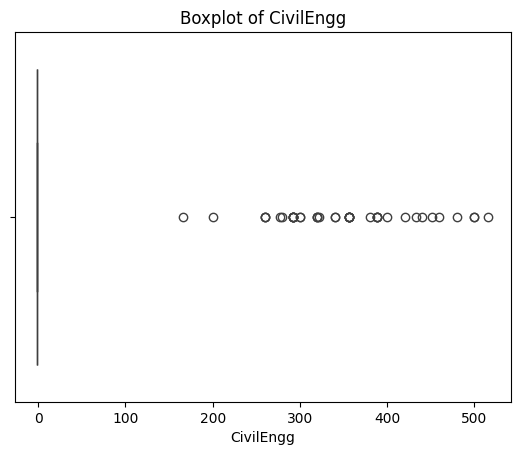

Outliers in CivilEngg:            ID    Salary           DOJ           DOL  \
26      65096  345000.0   1/1/11 0:00  10/1/13 0:00   
59     536053  120000.0   9/1/09 0:00   4/1/13 0:00   
172   1089283  110000.0   6/1/14 0:00   2/1/15 0:00   
211     46302  350000.0  10/1/10 0:00   5/1/13 0:00   
222    226736  100000.0   3/1/13 0:00   6/1/13 0:00   
331    341114  700000.0   4/1/14 0:00       present   
403    795799  405000.0   7/1/14 0:00       present   
453   1253724  300000.0   6/1/15 0:00       present   
492    795862  525000.0   9/1/14 0:00       present   
493    609066  720000.0   2/1/14 0:00       present   
505    112626  500000.0   8/1/11 0:00       present   
605    319130  350000.0   6/1/12 0:00   4/1/15 0:00   
607    642404  600000.0   7/1/13 0:00       present   
896    285145  300000.0   6/1/12 0:00   9/1/14 0:00   
1108  1284153  225000.0   4/1/14 0:00   8/1/14 0:00   
1217   669692  600000.0  10/1/14 0:00   2/1/15 0:00   
1253   192714  650000.0  12/1/11 0:00     

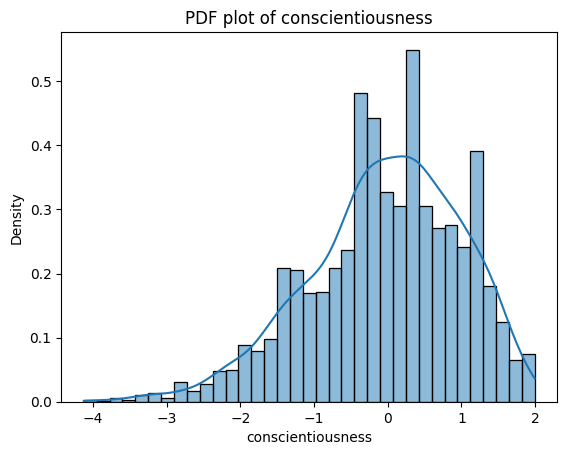

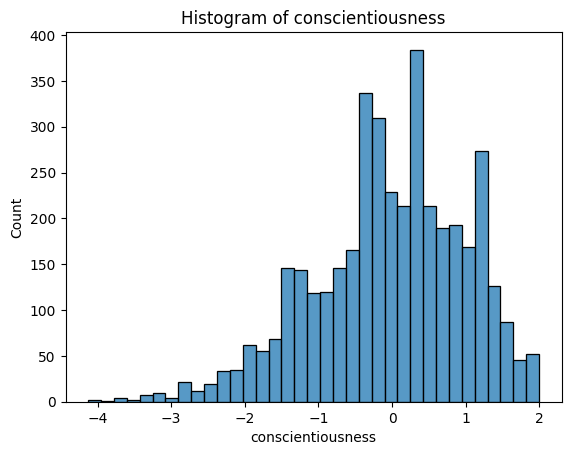

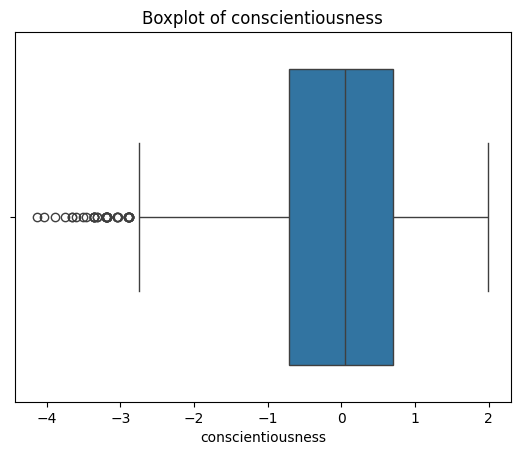

Outliers in conscientiousness:            ID     Salary           DOJ           DOL  \
29     472956   220000.0  11/1/14 0:00   4/1/14 0:00   
159    755080   340000.0   6/1/14 0:00   4/1/15 0:00   
210     30739   310000.0   9/1/10 0:00   3/1/12 0:00   
315    232430   360000.0   5/1/12 0:00       present   
335   1042343   120000.0   2/1/14 0:00       present   
373    215639   370000.0   3/1/14 0:00       present   
382     50739   260000.0   3/1/11 0:00       present   
408   1175511   280000.0   2/1/15 0:00   7/1/15 0:00   
468   1073243   240000.0   7/1/13 0:00       present   
523   1061906   120000.0   3/1/14 0:00   4/1/15 0:00   
1211   632729   420000.0   8/1/13 0:00       present   
1337   355018   285000.0   2/1/13 0:00       present   
1353   578644   350000.0   6/1/13 0:00       present   
1684   455020   450000.0   3/1/13 0:00       present   
1687   326762   450000.0   3/1/13 0:00   3/1/15 0:00   
1972   228051   605000.0   5/1/12 0:00  12/1/14 0:00   
2005   225959   3

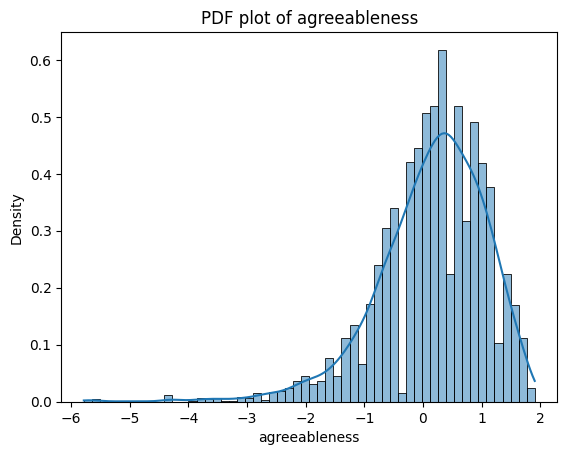

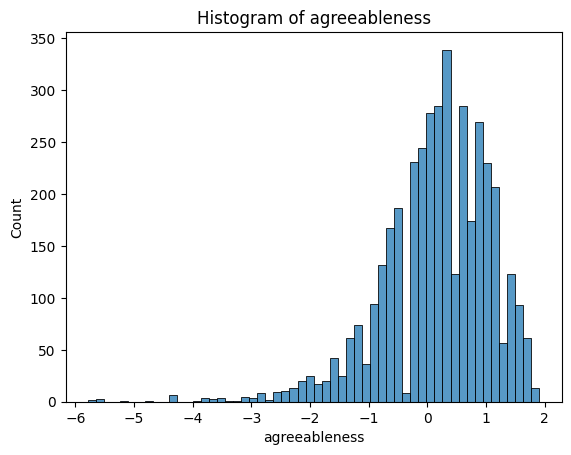

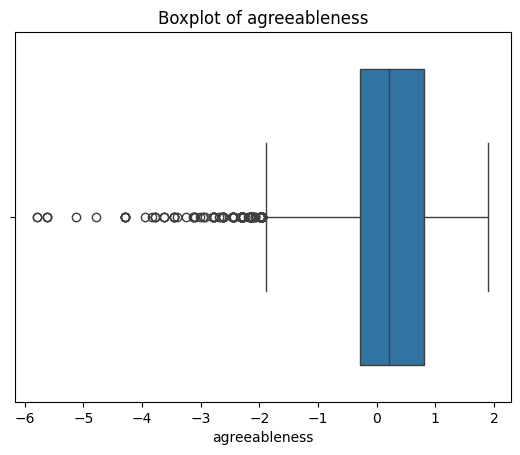

Outliers in agreeableness:            ID    Salary           DOJ           DOL  \
23     990077  180000.0   8/1/14 0:00   4/1/15 0:00   
43    1207660  120000.0   4/1/14 0:00   4/1/15 0:00   
63     636871  150000.0  10/1/14 0:00   4/1/15 0:00   
67     810433  400000.0   8/1/14 0:00   2/1/15 0:00   
157    728009  405000.0   8/1/13 0:00       present   
...       ...       ...           ...           ...   
3843   661427  240000.0   8/1/13 0:00   8/1/13 0:00   
3855   530061  300000.0   9/1/14 0:00       present   
3878   663824  260000.0  10/1/13 0:00       present   
3939   716325  100000.0   7/1/13 0:00  12/1/14 0:00   
3953   331779  160000.0   5/1/13 0:00       present   

                      Designation     JobCity Gender           DOB  \
23    electrical project engineer   Bangalore      m  7/30/86 0:00   
43                 .net developer  Hyderabad       m   7/5/93 0:00   
63             management trainee     Bhiwadi      m  1/10/92 0:00   
67                  test enginee

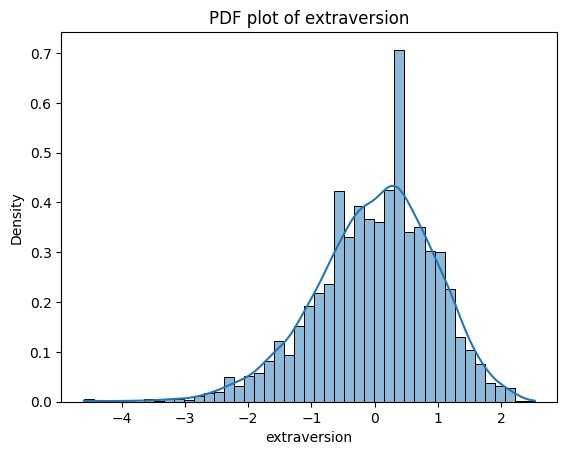

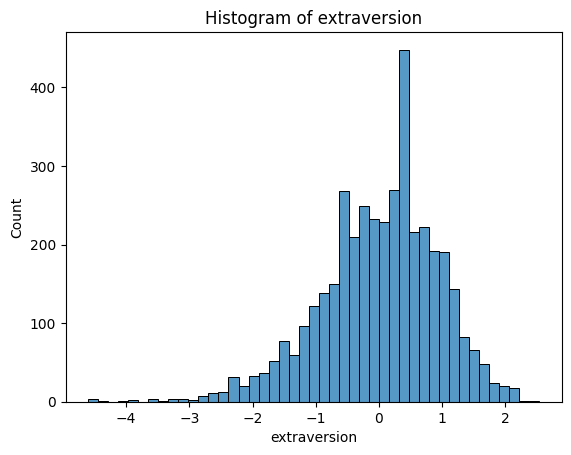

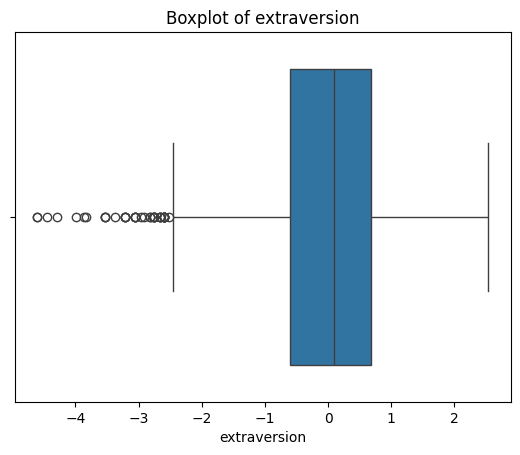

Outliers in extraversion:            ID    Salary           DOJ           DOL  \
63     636871  150000.0  10/1/14 0:00   4/1/15 0:00   
159    755080  340000.0   6/1/14 0:00   4/1/15 0:00   
335   1042343  120000.0   2/1/14 0:00       present   
408   1175511  280000.0   2/1/15 0:00   7/1/15 0:00   
523   1061906  120000.0   3/1/14 0:00   4/1/15 0:00   
666    820152  110000.0   1/1/14 0:00       present   
726    471413  480000.0   7/1/13 0:00   4/1/15 0:00   
1169   179878  105000.0   1/1/11 0:00   6/1/11 0:00   
1211   632729  420000.0   8/1/13 0:00       present   
1217   669692  600000.0  10/1/14 0:00   2/1/15 0:00   
1242   319644  395000.0   6/1/12 0:00   4/1/15 0:00   
1353   578644  350000.0   6/1/13 0:00       present   
1538   800117  105000.0  12/1/14 0:00   3/1/15 0:00   
1566   638264  180000.0   7/1/12 0:00  10/1/14 0:00   
1649   262345  375000.0   7/1/11 0:00   8/1/13 0:00   
1728   955531  300000.0   5/1/15 0:00       present   
1785   133165  240000.0  11/1/10 0:00  

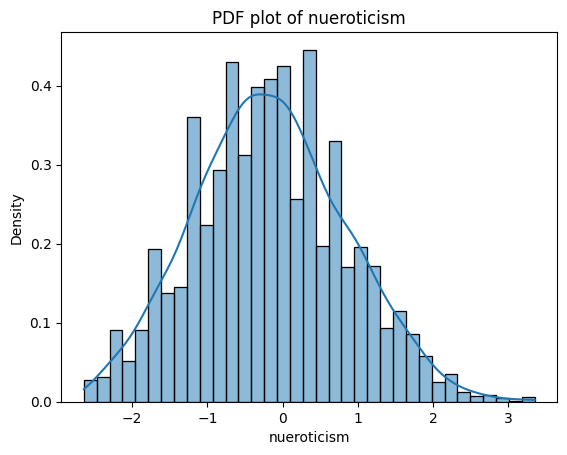

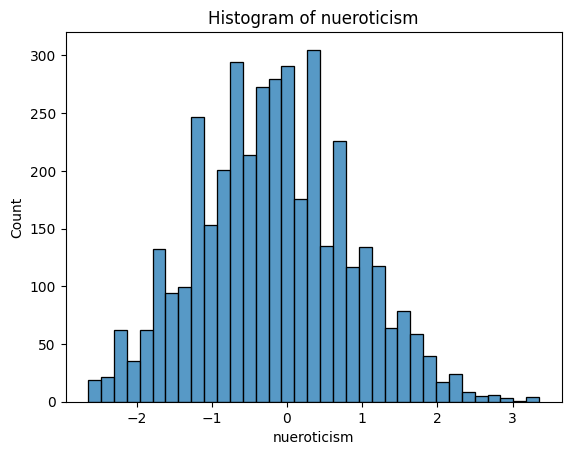

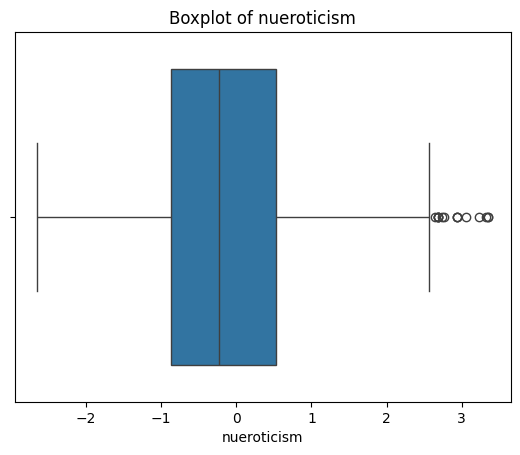

Outliers in nueroticism:            ID    Salary           DOJ          DOL  \
222    226736  100000.0   3/1/13 0:00  6/1/13 0:00   
405    601563  145000.0  10/1/13 0:00  7/1/14 0:00   
1151   346395  140000.0   7/1/12 0:00  1/1/14 0:00   
1191   356498  445000.0   3/1/13 0:00  5/1/15 0:00   
1383   349752  550000.0   6/1/12 0:00      present   
1602   862240  180000.0   4/1/14 0:00  4/1/15 0:00   
1843   843714  280000.0   8/1/13 0:00      present   
2054   348114  335000.0   7/1/13 0:00      present   
2234   530441  360000.0   2/1/14 0:00      present   
2275  1052796  100000.0   1/1/14 0:00      present   
2608   914037  180000.0  10/1/14 0:00  1/1/15 0:00   
2859  1152368  180000.0   1/1/14 0:00  2/1/15 0:00   
3089   690389  180000.0   2/1/13 0:00      present   
3384  1264544  120000.0  10/1/14 0:00  6/1/14 0:00   
3880  1233727  300000.0   6/1/15 0:00      present   

                     Designation     JobCity Gender            DOB  \
222                   programmer  Coimba

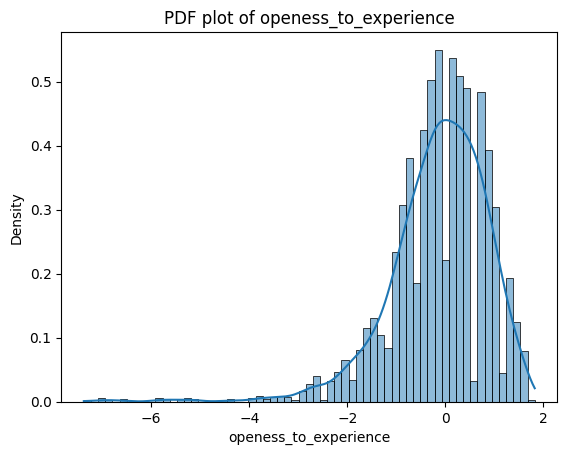

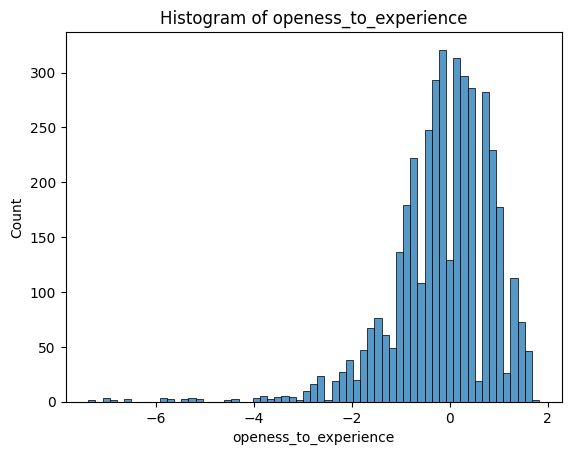

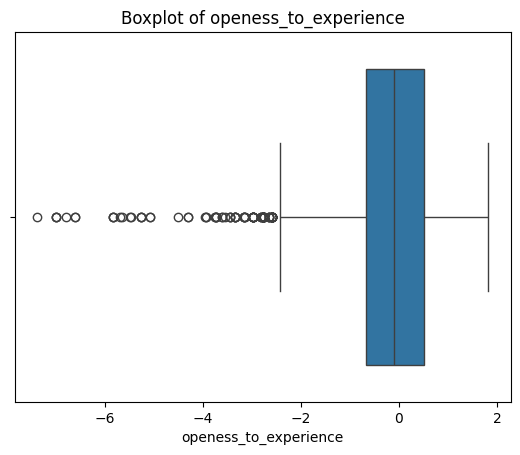

Outliers in openess_to_experience:            ID    Salary           DOJ           DOL  \
22     995191  190000.0  10/1/13 0:00   4/1/15 0:00   
23     990077  180000.0   8/1/14 0:00   4/1/15 0:00   
43    1207660  120000.0   4/1/14 0:00   4/1/15 0:00   
63     636871  150000.0  10/1/14 0:00   4/1/15 0:00   
128    206734  675000.0  11/1/11 0:00       present   
...       ...       ...           ...           ...   
3868   618243  320000.0   6/1/13 0:00       present   
3892  1089287  300000.0   8/1/14 0:00       present   
3901   677204  390000.0   7/1/13 0:00   4/1/15 0:00   
3918   988486  120000.0   8/1/14 0:00       present   
3957   425242  180000.0   9/1/12 0:00  10/1/13 0:00   

                         Designation     JobCity Gender           DOB  \
22                         developer   Hyderabad      m  1/23/92 0:00   
23       electrical project engineer   Bangalore      m  7/30/86 0:00   
43                    .net developer  Hyderabad       m   7/5/93 0:00   
63          

In [13]:
#Check for outliers
import seaborn as sns
import matplotlib.pyplot as plt
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns


for col in numerical_cols:

    sns.histplot(df[col], kde=True, stat='density')
    plt.title(f'PDF plot of {col}')
    plt.show()

    # Histogram
    sns.histplot(df[col])
    plt.title(f'Histogram of {col}')
    plt.show()

    # Boxplot
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

    # Finding outliers
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[col] < (Q1 - 1.5 * IQR)) | (df[col] > (Q3 + 1.5 * IQR))]
    print(f'Outliers in {col}: {outliers}')

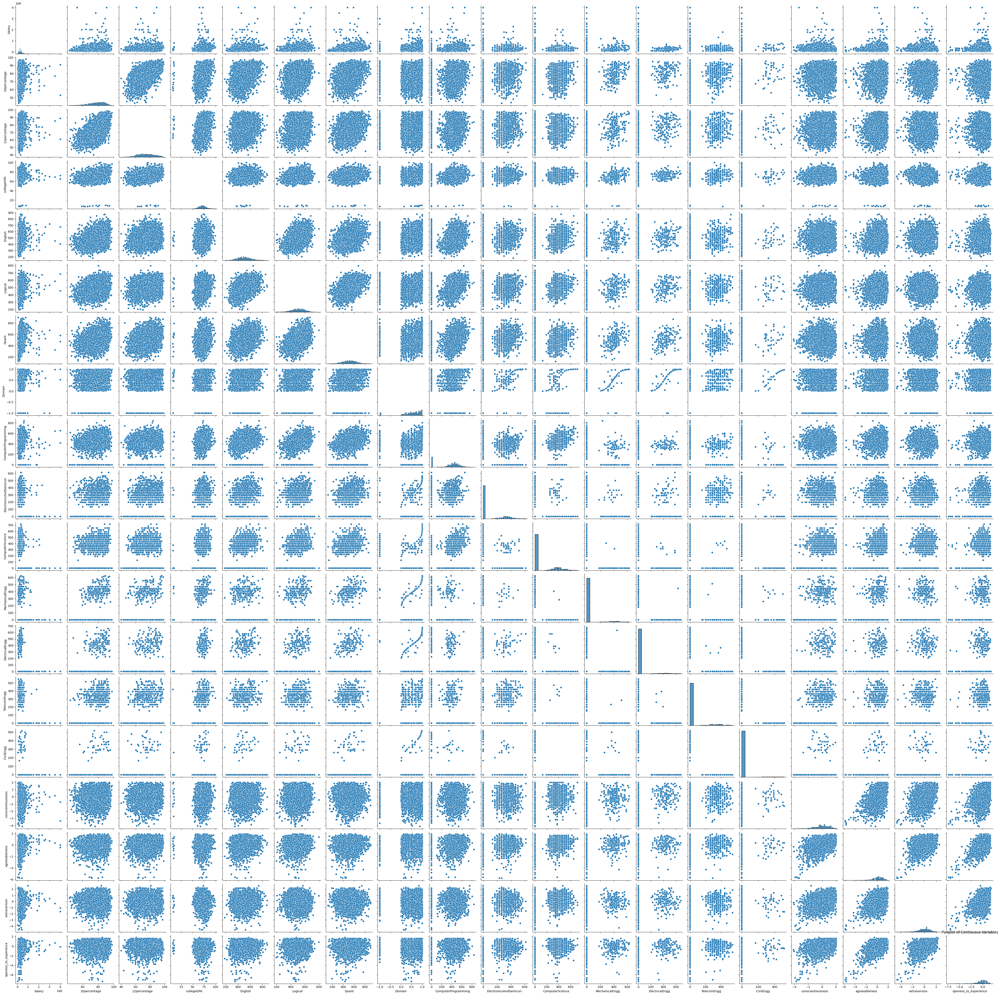

In [19]:
continuous_vars = ['Salary', '10percentage', '10board', '12percentage', 'collegeGPA', 'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'openess_to_experience']
sns.pairplot(df[continuous_vars])
plt.title("Pairplot of Continuous Variables")
plt.show()

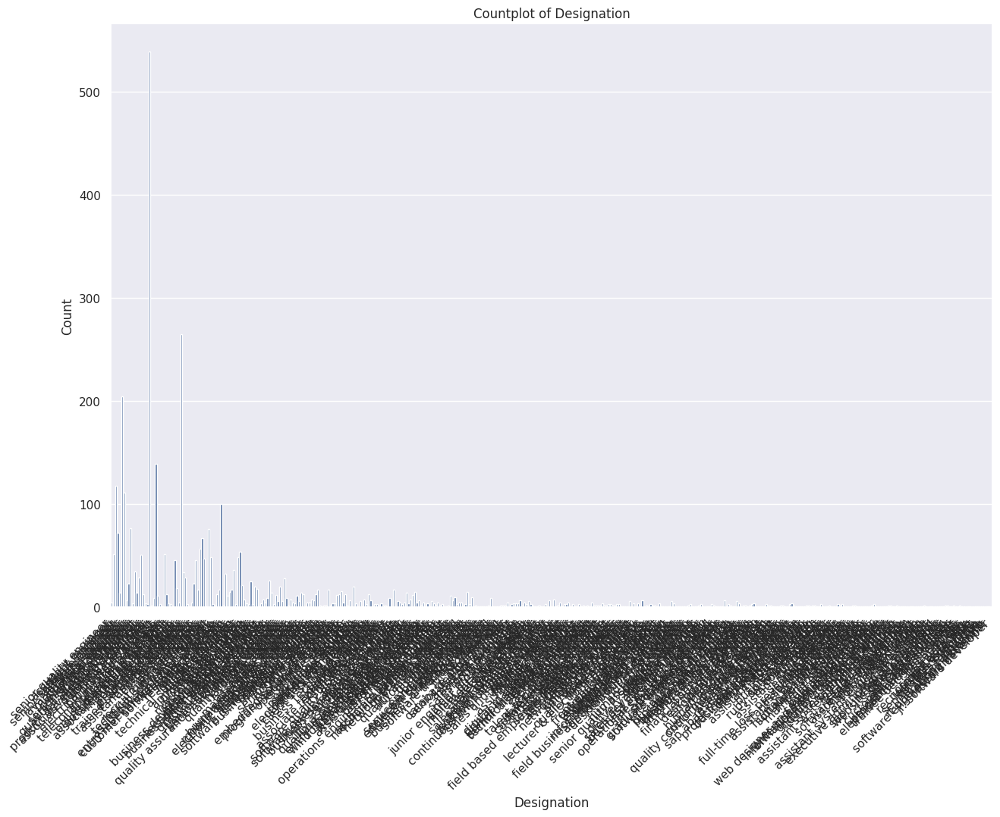

In [20]:
sns.set(style="darkgrid")


plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='Designation')
plt.title('Countplot of Designation')
plt.xlabel('Designation')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

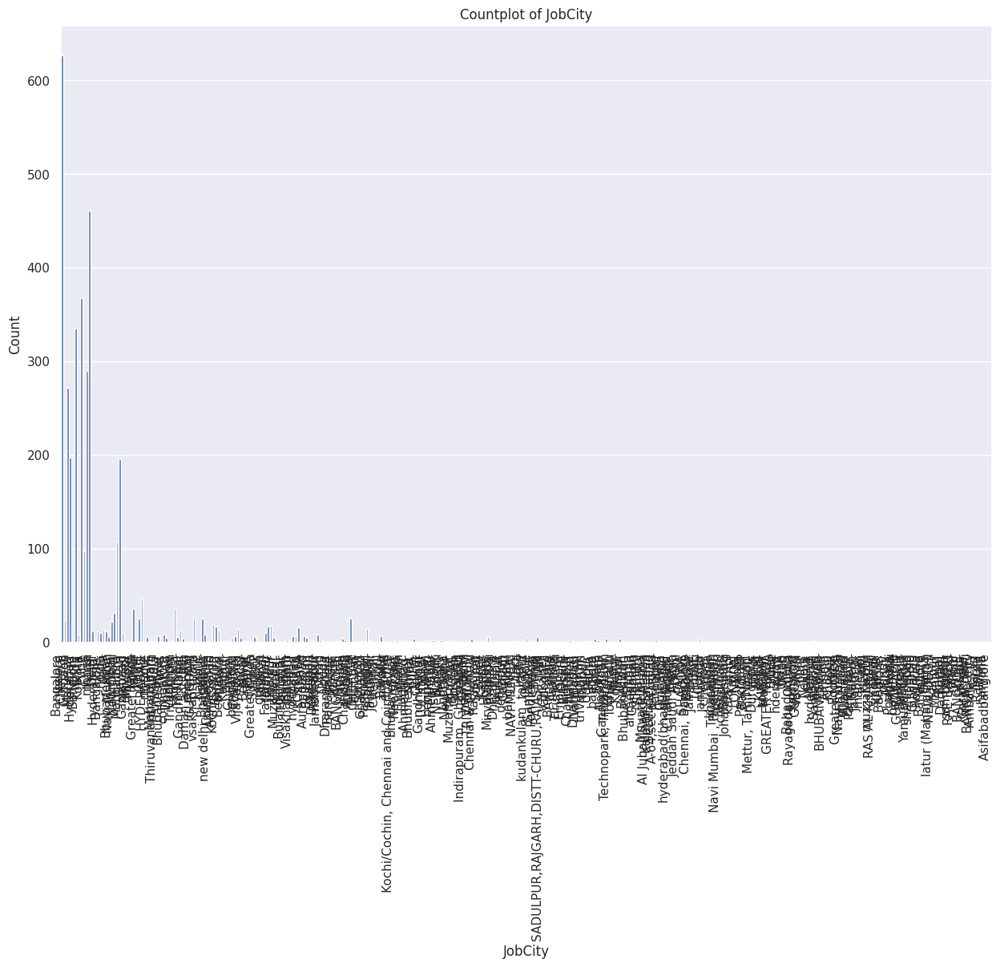

In [21]:
sns.set(style="darkgrid")


plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='JobCity')
plt.title('Countplot of JobCity')
plt.xlabel('JobCity')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.show()

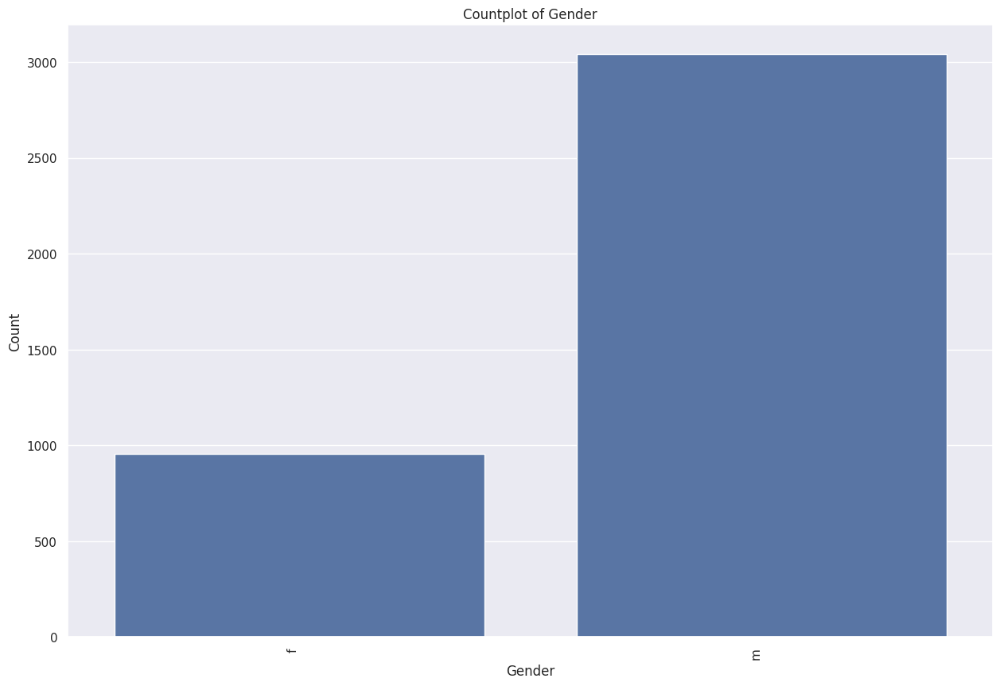

In [22]:
sns.set(style="darkgrid")

plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='Gender')
plt.title('Countplot of Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.show()

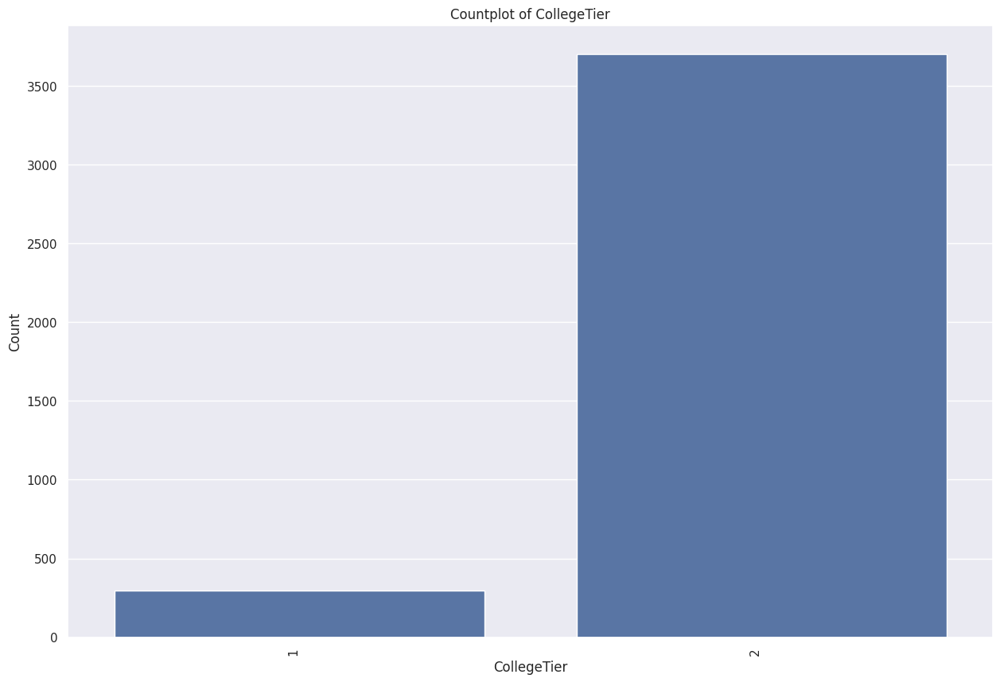

In [23]:
sns.set(style="darkgrid")

plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='CollegeTier')
plt.title('Countplot of CollegeTier')
plt.xlabel('CollegeTier')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.show()

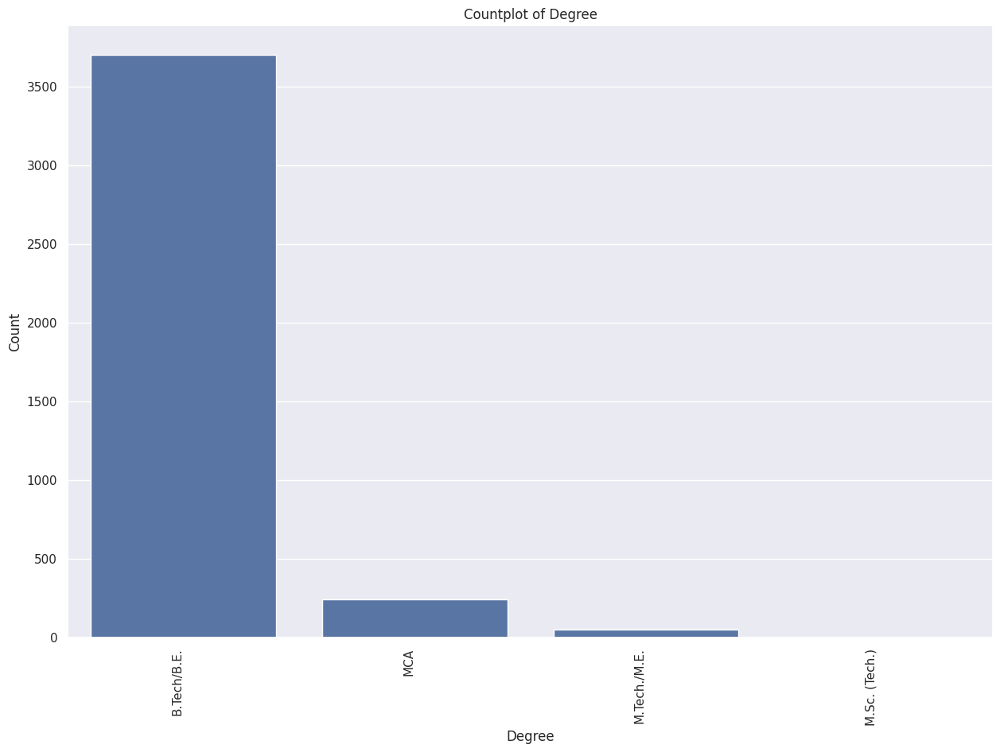

In [24]:
sns.set(style="darkgrid")

plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='Degree')
plt.title('Countplot of Degree')
plt.xlabel('Degree')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.show()

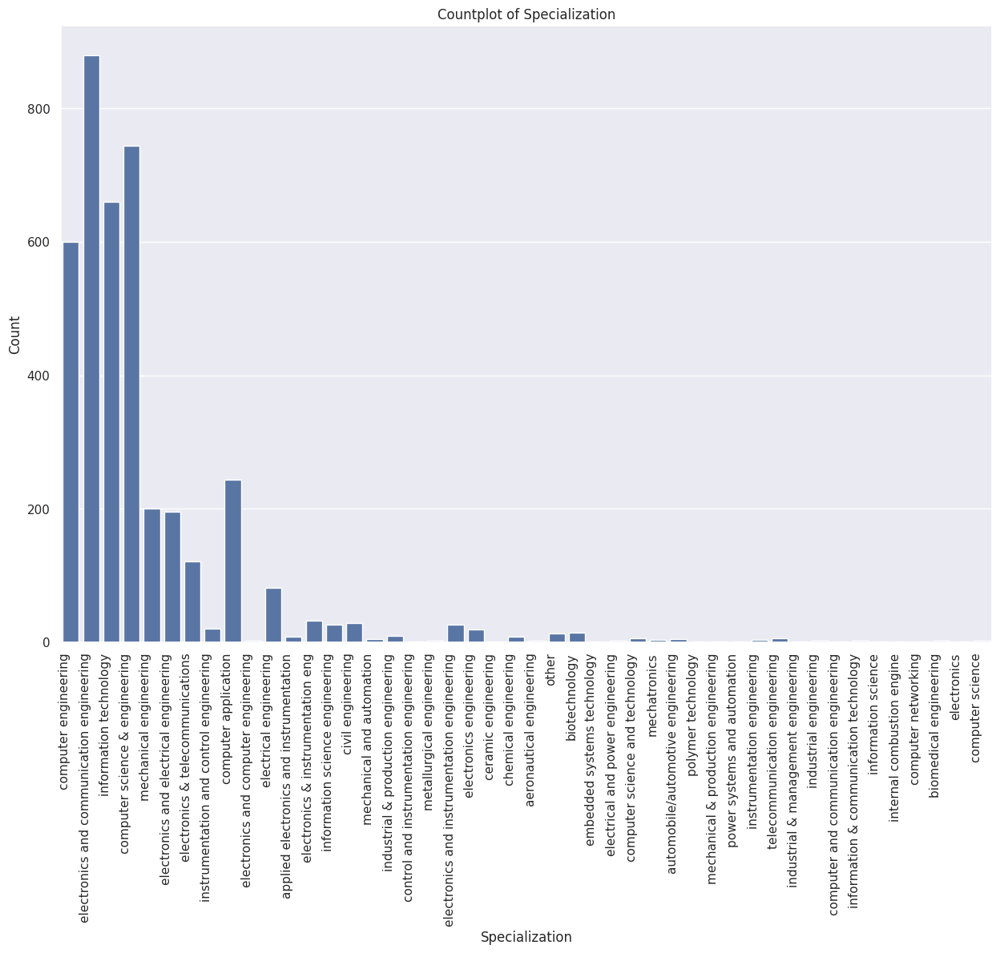

In [25]:
sns.set(style="darkgrid")

plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='Specialization')
plt.title('Countplot of Specialization')
plt.xlabel('Specialization')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.show()

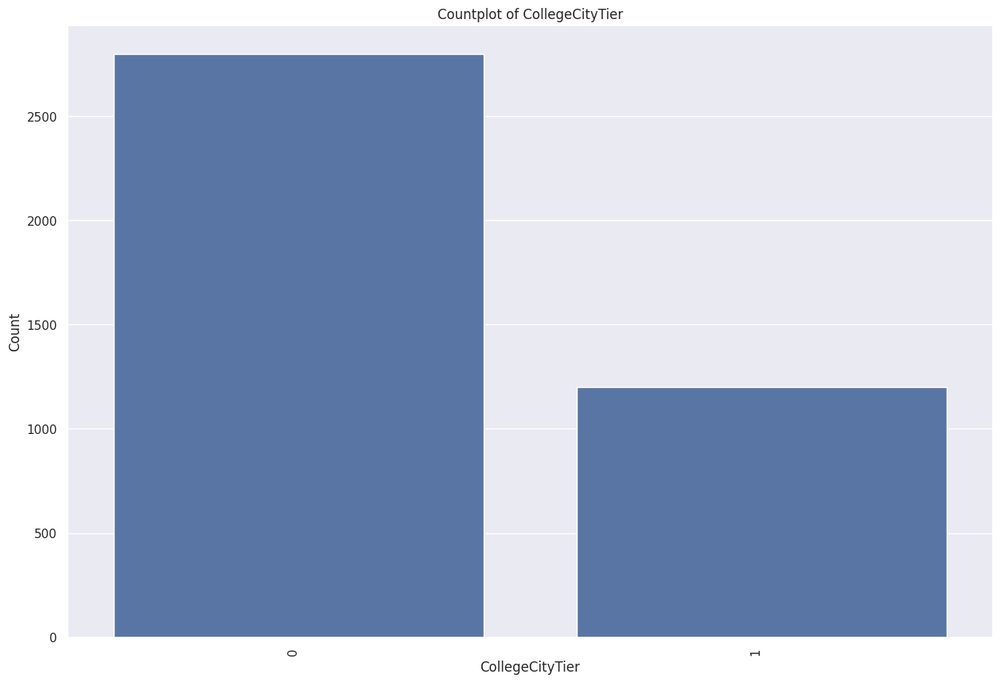

In [26]:
sns.set(style="darkgrid")

plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='CollegeCityTier')
plt.title('Countplot of CollegeCityTier')
plt.xlabel('CollegeCityTier')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.show()

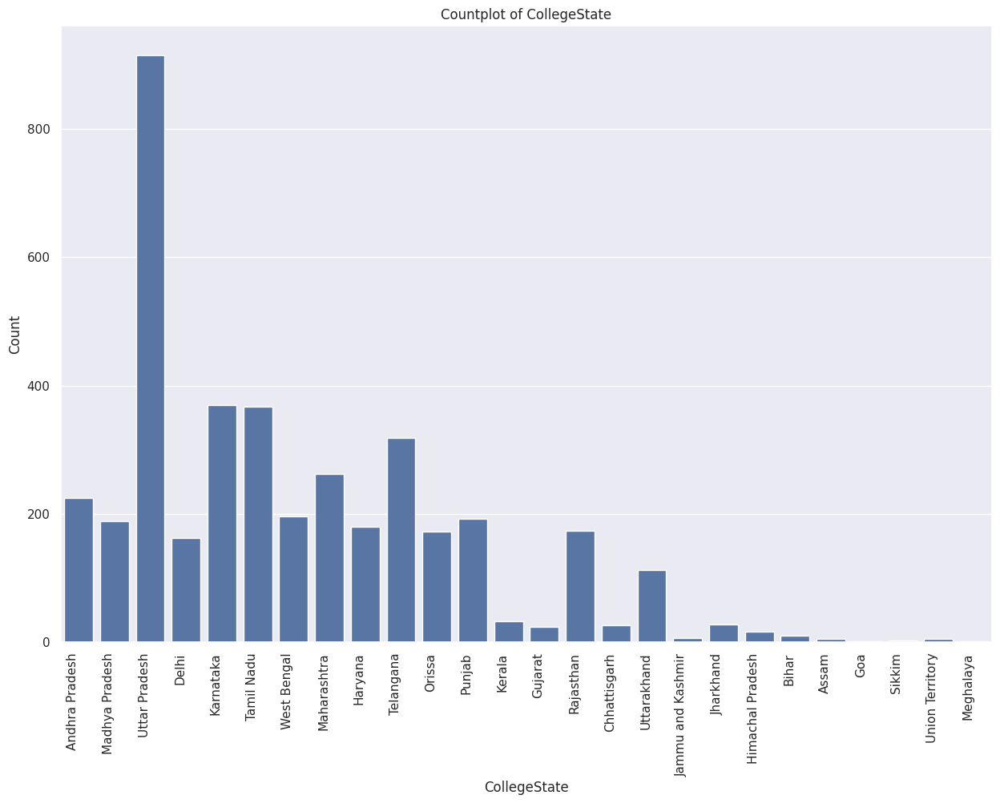

In [27]:
sns.set(style="darkgrid")

plt.figure(figsize=(15, 10))
sns.countplot(data=df, x='CollegeState')
plt.title('Countplot of CollegeState')
plt.xlabel('CollegeState')
plt.ylabel('Count')
plt.xticks(rotation=90, ha='right')
plt.show()

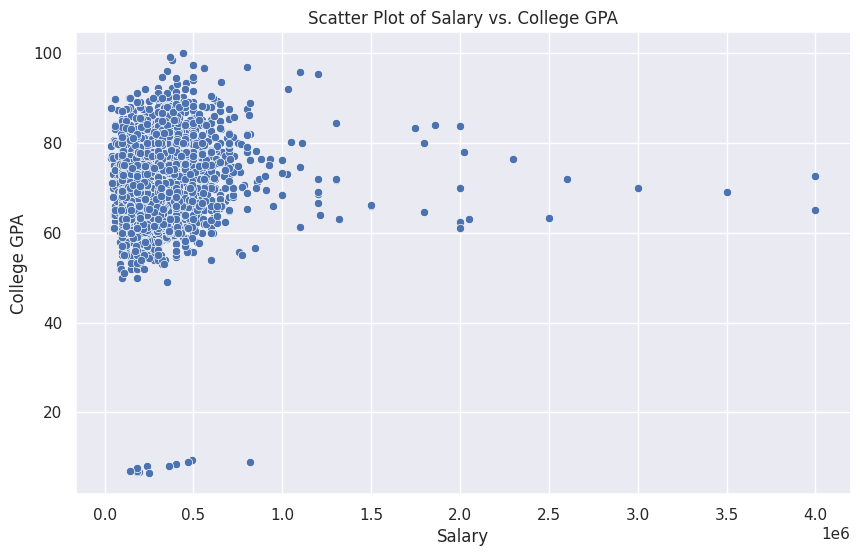

In [28]:
#Bivariate Analysis

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Salary', y='collegeGPA')
plt.title('Scatter Plot of Salary vs. College GPA')
plt.xlabel('Salary')
plt.ylabel('College GPA')
plt.show()


<Figure size 1000x600 with 0 Axes>

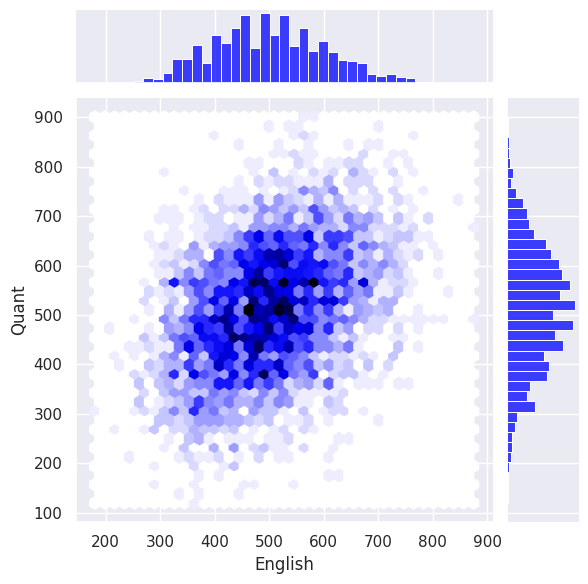

In [29]:
plt.figure(figsize=(10, 6))
sns.jointplot(data=df, x='English', y='Quant', kind='hex', color='blue')
plt.show()

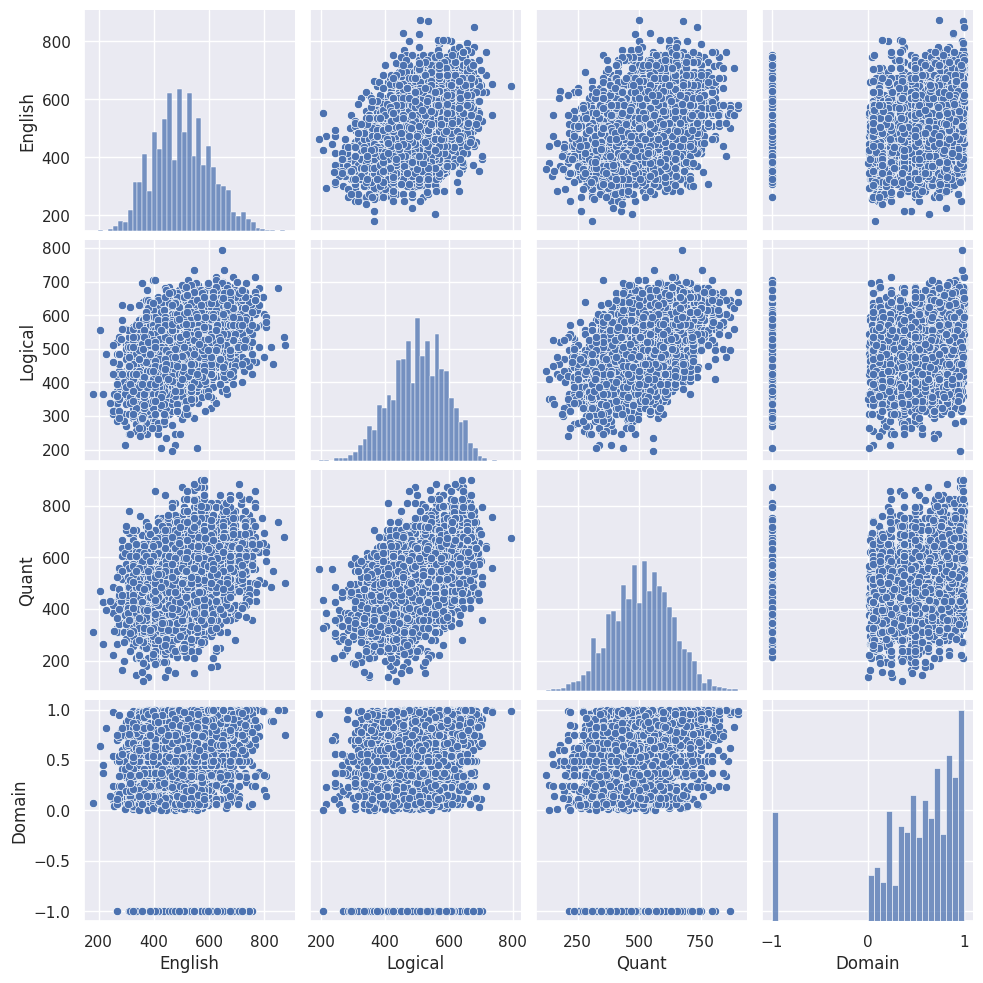

In [30]:
sns.pairplot(df[['English', 'Logical', 'Quant', 'Domain']])
plt.show()


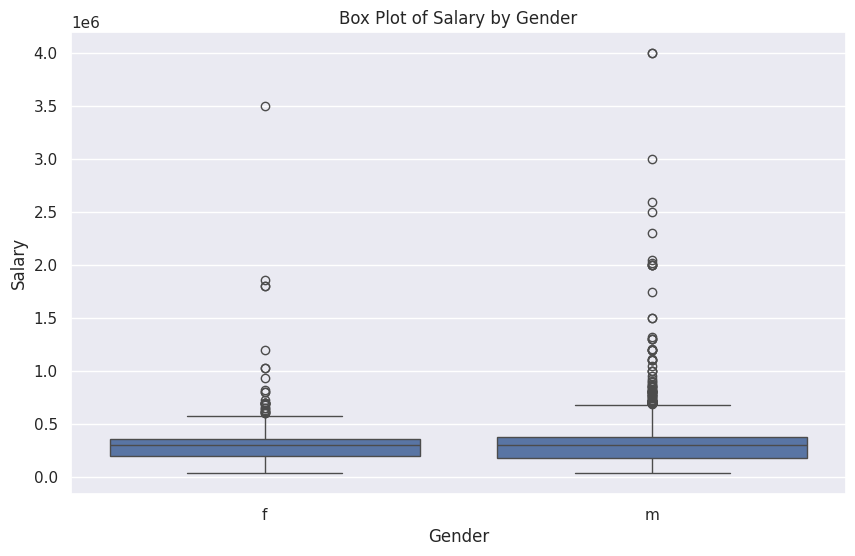

In [31]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Gender', y='Salary')
plt.title('Box Plot of Salary by Gender')
plt.xlabel('Gender')
plt.ylabel('Salary')
plt.show()


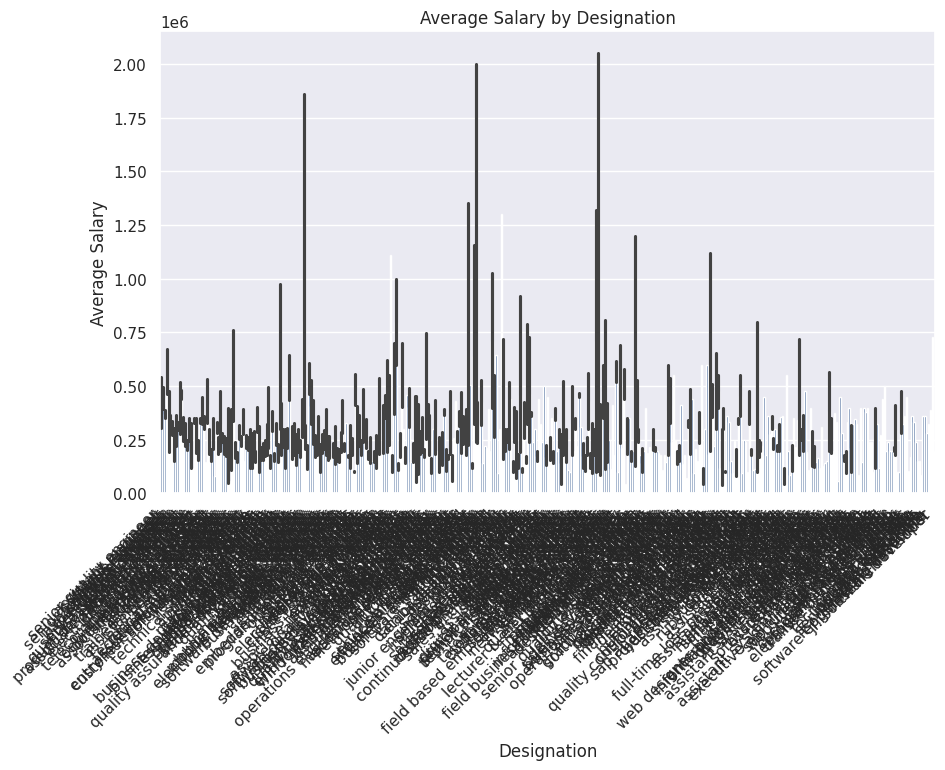

In [32]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='Designation', y='Salary')
plt.title('Average Salary by Designation')
plt.xlabel('Designation')
plt.ylabel('Average Salary')
plt.xticks(rotation=45, ha='right')
plt.show()


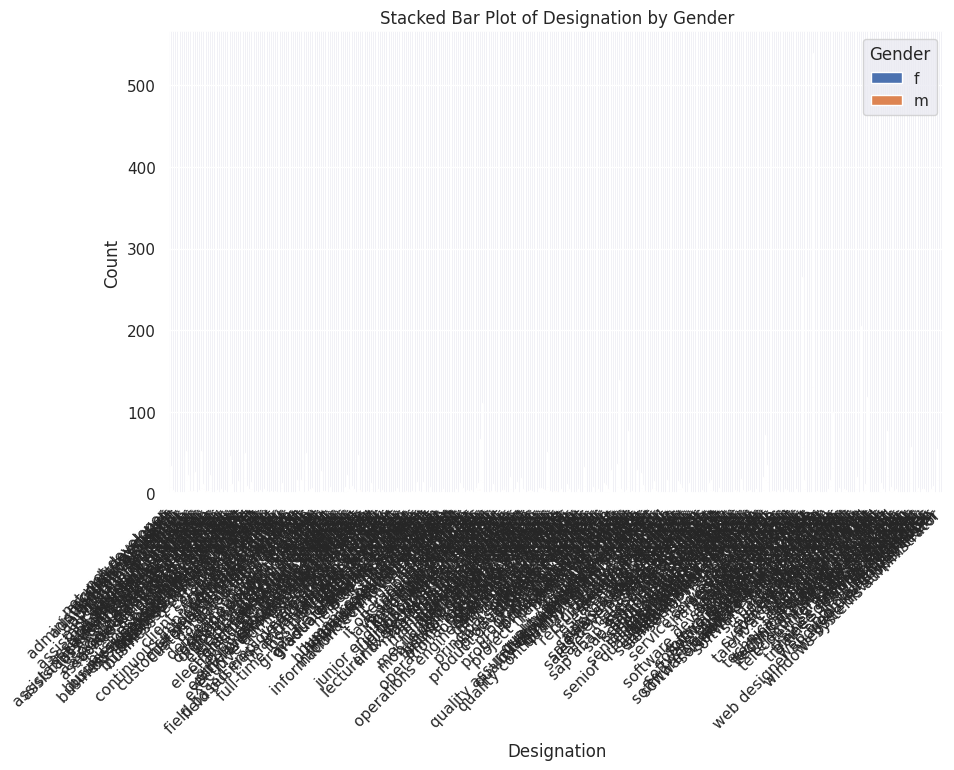

In [33]:
stacked_data = df.groupby(['Designation', 'Gender']).size().unstack()
stacked_data.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Stacked Bar Plot of Designation by Gender')
plt.xlabel('Designation')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()
